<fieldset style="padding:10px; border:1px solid #ccc; box-shadow:2px 2px 5px rgba(0,0,0,0.1);">
<legend style="font-size: 10px; color:#555;">Credits</legend>

<table style="width: 100%; border-collapse: collapse;">
    <tr>
        <td style="width: 80px; vertical-align: top;">
            <img src="https://raw.githubusercontent.com/AstroStat-Academy/assets-public/main/logo/logo_b_text_lowres.png" alt="AstroStat Academy logo" width="100">
        </td>
        <td style="vertical-align: center; padding-left: 15px; font-size: 10px; line-height: 1.2;">
            This notebook contains original work by the authors unless stated otherwise.
            Any external material is properly credited to its sources.<br>
            References to papers, datasets, and software are acknowledged.
            Original content is licensed under the <a href="https://www.gnu.org/licenses/gpl-3.0.en.html">GNU General Public License v3.0 (GNU GPLv3)</a>.
        </td>
    </tr>
</table>

</fieldset>
<!-- Allow these <br> or it will look ugly once rendered on Jupyter Book. -->
<br>

# Neural Network Interpretability - Hands On <a class="tocSkip">

In this session we open the black box: we train neural networks and then ask them **why** they predict what they predict.

We will work through (with **intermediate tasks**):

- the simplest attribution method — **saliency maps** — and its failure mode
- a principled fix: **integrated gradients**, with a built-in correctness check
- both methods on a real model: **MNIST** (trained live) or **ImageNet** (pretrained) — your choice
- a first taste of **mechanistic interpretability**: how circuits form across the layers, drawn live on the model
- the full pipeline on a **galaxy morphology** classifier, ending with real DECaLS images

$\rightarrow$ The target is to leave with a small, working **interpretability toolbox** that you can apply, <u>as is</u>, to your own models and research.

# Setup

In [ ]:
#!pip install torch torchvision --quiet       # already installed on Colab
#!pip install transformers datasets --quiet    # only for the optional Galaxy10 cell

In [ ]:
# On Colab: clone the course repository and cd into the notebook's folder,
# so that local files behave exactly as in the repo. (No effect locally.)
import requests

url = "https://raw.githubusercontent.com/AstroStat-Academy/assets-public/main/colab/clone_and_cd_colab.py"
colab = requests.get(url).text
exec(colab)

In [ ]:
# Set the global plotting style. This also imports matplotlib (as plt)
# and seaborn -> do NOT import them again below.
import requests

url = "https://raw.githubusercontent.com/AstroStat-Academy/assets-public/main/styles/plot_style.py"
style = requests.get(url).text
exec(style)

In [ ]:
# core numerics + PyTorch
import numpy as np
import torch
import torch.nn as nn              # layers (Linear, Conv2d, ...)
import torch.nn.functional as F    # stateless ops (relu, cross_entropy, ...)

# fix all random seeds -> everyone in the room gets the same results
torch.manual_seed(0)
np.random.seed(0)

# use a GPU if there is one; everything here also runs fine on CPU
device = "cuda" if torch.cuda.is_available() else "cpu"
print("device:", device)

# Why Interpretability?

Neural networks are **excellent fitters** and **terrible explainers**. A trained CNN can classify galaxies as well as an expert — but it hands us a prediction, not a *reason*.

For science this is a real problem, for at least three reasons:

- **Trust**: before we publish a catalog built by a classifier, we want evidence that it uses *physics* (morphology, colors) and not *artifacts* (PSF shape, background level, which survey the image came from).
- **Debugging**: when the model fails, attribution shows *what it was looking at* — often the fastest route to bad labels or biased training data.
- **Discovery**: occasionally the model knows something we do not. Understanding *what* it learned can point back at the science.

## Terminology

Keep in mind that:

- **attribution** means assigning (parts of) the prediction to parts of the *input* (which pixels?) or parts of the *model* (which neurons?)
- a **saliency map** is the simplest input attribution: the plain gradient
- a **baseline** is a reference input representing the "absence of signal" (e.g. a black image) — central for integrated gradients
- **mechanistic interpretability** explains predictions via internal components — neurons, layers, and **circuits** (*minimal subnetworks responsible for a behavior*)

## How to deal with an interpretability question (Overview)

Attribution methods can *lie*. So we follow a standard methodology:

> **1. Pick a method and understand its assumptions**
>
> **2. Sanity-check it on a problem where the answer is known**
>
> **3. Apply it to the real model**
>
> **4. Verify: check axioms, ablate, compare methods**
>
> **5. Only then: trust (some of) the explanation**

<u>Note:</u> step 2 is the one everybody skips. We will not.

# Saliency Maps: Peeking Inside the Black Box

Our model is a function $F$ that eats an input vector $x = (x_1, \ldots, x_d)$ — which could be tabular features, or pixels in an image — and returns a **score** (such as the logit for a specific class). 

To understand why the model made a certain prediction, we want one number per feature that answers a straightforward question: *"How much does feature $i$ matter for this score?"*

### 1. The Gradient as Local Sensitivity

To answer this, we look to the partial derivative:

$$\frac{\partial F}{\partial x_i}(x) \;=\; \lim_{h \to 0} \frac{F(x_1, \ldots, x_i + h, \ldots, x_d) - F(x)}{h}$$

Read this equation literally: *nudge feature $i$ by a tiny amount $h$, keep everything else fixed, and see how much the score moves per unit of nudge.* * **A large absolute value** $\rightarrow$ the score reacts strongly to this feature. 
* **Zero** $\rightarrow$ locally, this feature is completely ignored by the model.

### 2. The Linear Approximation (Why this works)

If we collect all $d$ partial derivatives, we get the **gradient**, $\nabla F(x)$. 

According to the first-order Taylor expansion, *near* our specific input $x$, our highly complex, non-linear neural network behaves a lot like a simple **linear** function whose slopes are exactly those derivatives:

$$F(x + \delta) \;\approx\; F(x) + \sum_i \frac{\partial F}{\partial x_i}(x)\, \delta_i$$

This is exactly *why* the gradient deserves the name "sensitivity". It represents the slope of the **best local linear approximation** of the network. The slope for feature $i$ is its local leverage on the final score.

### 3. Constructing the Saliency Map

When we ask, *"Does this feature matter at all?"* the *direction* of the effect (positive or negative) is often secondary to the magnitude. Because of this, we typically take the absolute value:

$$S_i(x) = \left| \frac{\partial F(x)}{\partial x_i} \right|$$

This gives us one importance score per feature. For images, this means one score per **pixel**, which we can easily visualize as a heatmap (introduced by Simonyan et al., 2013).

### 4. How PyTorch Does the Heavy Lifting

Under the hood, PyTorch records every operation of your forward pass in a *computational graph*. When you call `score.backward()`, it triggers **backpropagation**: it walks that graph backwards, applying the **chain rule** at every node, and deposits the value of $\partial(\mathrm{score})/\partial(\mathrm{thing})$ into `thing.grad` for every tensor marked with `requires_grad=True`.

> **The Interpretability Trick:**
> During standard *training*, the "thing" we want gradients for are the model's weights. Here, we flip the script: we mark the **input image** with `x.requires_grad_(True)` and harvest `x.grad` instead.

This allows us to get all $d$ sensitivities in a **single backward pass**, at roughly the cost of one extra forward pass. This incredible efficiency is what makes saliency maps so cheap and popular to compute.

---

## Sanity Check: A Toy Classifier

Before we point this technique at a massive ResNet, we need to establish a golden rule of interpretability research:

**Never test an interpretability method for the first time on a problem you do not completely understand.**

To ensure our saliency maps are actually working, we will build a synthetic dataset where the ground truth is known **by construction**:
* The label depends *only* on **Feature 0**.
* **Feature 1** is pure, unadulterated noise.

$\rightarrow$ A good attribution method **must** assign all the importance to Feature 0. If it gives high importance to Feature 1, we know immediately that the *interpretability method* is broken—not the model. Let's code this up.

In [338]:
# ---- data: 500 points, 2 features -----------------------------------
X = torch.randn(500, 2)       # both features ~ N(0, 1)
y = (X[:, 0] > 0).long()      # label depends ONLY on feature 0
                              # -> ground-truth importances: (1, 0)

# ---- a tiny MLP classifier -------------------------------------------
toy_model = nn.Sequential(nn.Linear(2, 16),   # 2 features -> 16 hidden units
                          nn.ReLU(),
                          nn.Linear(16, 2))   # -> 2 class logits
opt = torch.optim.Adam(toy_model.parameters(), lr=0.01)

# ---- standard training loop (full batch, 300 steps) ------------------
for step in range(300):
    opt.zero_grad()                           # reset gradients
    loss = F.cross_entropy(toy_model(X), y)   # classification loss
    loss.backward()                           # backprop
    opt.step()                                # update the weights

acc = (toy_model(X).argmax(1) == y).float().mean()
print(f"train accuracy {acc:.1%}")            # ~99%: the task is easy

train accuracy 99.8%


Implementation: one backward pass from the predicted-class logit to the input. Averaged over 100 fresh test points, saliency should hand (almost) all importance to feature 0:

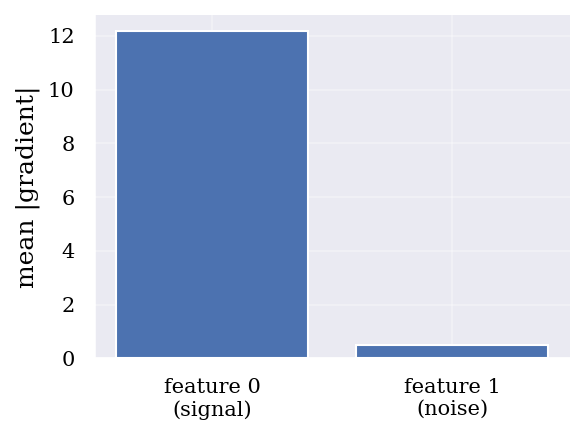

In [339]:
def saliency(model, x, target):
    """|d F_target / d x| for a single input x (1-D tensor)."""
    x = x.clone().detach().requires_grad_(True)   # track gradients on the INPUT
    score = model(x.unsqueeze(0))[0, target]      # the scalar we explain: one logit
    score.backward()                              # d(score)/d(x) -> stored in x.grad
    return x.grad.abs()                           # keep the magnitude only


# average the saliency of the PREDICTED class over 100 fresh test points
X_test = torch.randn(100, 2)
sal = torch.stack([
    saliency(toy_model, xi, toy_model(xi.unsqueeze(0)).argmax().item())
    for xi in X_test
]).mean(0)                                        # (2,): mean |gradient| per feature

fig = plt.figure(figsize=(4, 3))
plt.bar(["feature 0\n(signal)", "feature 1\n(noise)"], sal.numpy())
plt.ylabel("mean |gradient|")
plt.tight_layout()
plt.show()

<div style="border-left: 5px solid #FFA500; background-color: rgba(255, 165, 0, 0.15); padding: 10px; border-radius: 4px; color: inherit;">

<font size=4>**Question**</font>

We took the **absolute value** of the gradient. What information does the *sign* carry — and when would you want to keep it?

</div>

<div style="border-left: 4px solid #e57373; padding-left: 1em; padding-top: 1em; padding-bottom: 1em; margin: 1em 0; background: #fdecea; color: #1a1a1a;">
<details>

<b><summary>[Spoiler] (click here to expand)</summary></b>

The sign is the <b>direction</b>: a positive gradient means <i>increasing</i> this feature <i>increases</i> the class score. For "which features matter at all?" the magnitude suffices. The sign is useful for "does this pixel argue <i>for</i> or <i>against</i> the class?"

</details>
</div>

## Saturation: where saliency fails

Gradients are **local**. And a well-trained network is *confident* on most inputs — which means the output sits on a **flat plateau**: small wiggles change nothing.

$\rightarrow$ On a plateau the gradient is $\approx 0$, *even for the features that caused the prediction*.

Watch it happen on a single sigmoid "neuron":

In [ ]:
# a single, very confident "neuron": output = sigmoid(4x)
xs = torch.linspace(-3, 3, 200, requires_grad=True)
ys = torch.sigmoid(4 * xs)
ys.sum().backward()                # gradient of the output at every x, in one go

fig, ax = plt.subplots(1, 2, figsize=(9, 3))
ax[0].plot(xs.detach(), ys.detach())
ax[0].set_title("output: sigmoid(4x)")
ax[1].plot(xs.detach(), xs.grad)   # <- this IS the saliency, at every x
ax[1].set_title("gradient (saliency)")
for a in ax:
    a.axvline(2.5, color="red", ls="--")   # a confidently-classified input
    a.set_xlabel("x")
plt.tight_layout()
plt.show()

<div style="border-left: 4px solid #e57373; padding-left: 1em; padding-top: 1em; padding-bottom: 1em; margin: 1em 0; background: #fdecea; color: #1a1a1a;">

**WARNING:** At $x = 2.5$ the input clearly drove the output to $\approx 1$, yet its saliency is $\approx$ **zero**.

$\rightarrow$ Saliency would tell you this feature does not matter. That is <u>wrong</u>.

</div>

# Integrated Gradients

The fix (Sundararajan et al. 2017) is to change the question. Instead of *"how sensitive is the output **here**?"* we ask:

> *How much did the output change **because of feature $i$**, as the input grew from "nothing" to $x$?*

Formally: pick a **baseline** $x'$ representing the absence of signal (e.g. all zeros), and accumulate gradients along the straight path from $x'$ to $x$:

$$ \mathrm{IG}_i(x) = (x_i - x'_i) \int_0^1 \frac{\partial F\big(x' + \alpha (x - x')\big)}{\partial x_i} \, d\alpha $$

Even if the endpoint is saturated, the path **passes through** the region where the features were actively pushing the output up — and IG collects those gradients.

Two axioms make IG more than a heuristic:

- **Completeness**: $\sum_i \mathrm{IG}_i(x) = F(x) - F(x')$ $\rightarrow$ the attributions add up to the *actual* change in output. A **built-in correctness check**, for free.
- **Sensitivity**: a feature that changes the prediction receives non-zero attribution — exactly the property saturation broke.

<div style="border-left: 4px solid #2196F3; padding-left: 1em; padding-top: 1em; padding-bottom: 1em; margin: 1em 0; background: #f0f8ff; color: #1a1a1a;">

<details>

<b><summary>[Why completeness holds] (click here to expand)</summary></b>

Let $\gamma(\alpha) = x' + \alpha (x - x')$, so $\gamma(0) = x'$ and $\gamma(1) = x$. Apply the fundamental theorem of calculus to $g(\alpha) = F(\gamma(\alpha))$:

$$ F(x) - F(x') = \int_0^1 g'(\alpha)\, d\alpha = \int_0^1 \sum_i \frac{\partial F(\gamma(\alpha))}{\partial x_i} (x_i - x'_i) \, d\alpha = \sum_i \mathrm{IG}_i(x) ~ \blacksquare$$

</details>
</div>

In practice the integral becomes a midpoint **Riemann sum** over `steps` points along the path.

## A network that saturates by construction

$$ F(x) = 1 - \mathrm{ReLU}(1 - x_1 - x_2) \quad \rightarrow \quad \text{flat (gradient } \mathbf{0}\text{) once } x_1 + x_2 \ge 1 $$

In [ ]:
class SaturatedNet(nn.Module):
    """F(x) = 1 - relu(1 - x1 - x2): output stuck at 1 once x1 + x2 >= 1."""
    def forward(self, x):
        return 1 - torch.relu(1 - x[..., 0] - x[..., 1])


saturated_model = SaturatedNet()

# vanilla saliency at x = (1, 1): both features clearly pushed F from 0 to 1,
# but the output is flat there...
xg = torch.tensor([1.0, 1.0], requires_grad=True)
saturated_model(xg.unsqueeze(0)).squeeze().backward()
print("vanilla gradient at (1,1):", xg.grad.numpy(), "  <- sees nothing!")

Implementation: midpoint **Riemann sum** along the path, then two checks — does IG see what the vanilla gradient missed, and does **completeness** hold?

In [ ]:
def integrated_gradients(model, x, baseline=None, target=None, steps=64):
    """IG for a single input x (1-D tensor)."""
    if baseline is None:
        baseline = torch.zeros_like(x)      # default: "absence of signal"
    # midpoints of `steps` sub-intervals: alpha_k = (k + 0.5) / steps
    alphas = torch.linspace(0, 1, steps + 1)[:-1] + 0.5 / steps
    total = torch.zeros_like(x)
    for a in alphas:
        # one point on the straight path baseline -> x
        xi = (baseline + a * (x - baseline)).detach().requires_grad_(True)
        out = model(xi.unsqueeze(0)).squeeze(0)
        score = out if target is None else out[target]   # scalar to attribute
        total += torch.autograd.grad(score, xi)[0]       # gradient AT this point
    # Riemann sum = mean gradient along the path, times the displacement
    return (x - baseline) * total / steps


# the saturated point from before
x = torch.tensor([1.0, 1.0])
ig = integrated_gradients(saturated_model, x, steps=256)
print("IG at (1,1):", ig.detach().numpy())      # ~(0.5, 0.5): credit restored!

# completeness: attributions must sum to the total change in output
delta = (saturated_model(x.unsqueeze(0)) - saturated_model(torch.zeros(1, 2))).item()
print(f"sum(IG) = {ig.sum():.4f}  vs  F(x) - F(baseline) = {delta:.4f}")

<div style="border-left: 4px solid #4CAF50; padding-left: 1em; padding-top: 1em; padding-bottom: 1em; margin: 1em 0; background: #e8f5e9; color: #1a1a1a;">

**NOTE:** The first half of the path from $(0,0)$ to $(1,1)$ is *not* saturated — IG picks up the gradient there; the point-gradient at the end misses it.

Each feature gets $0.5$, summing to $F(x) - F(x') = 1$ (**completeness**).

</div>

<div style="border-left: 4px solid #4CAF50; padding-left: 1em; padding-top: 1em; padding-bottom: 1em; margin: 1em 0; background: #e8f5e9; color: #1a1a1a;">

**Important take-away message #1**

An attribution without a *correctness check* is a rumor. Completeness turns IG into a **measurement**: if the attributions do not sum to $F(x) - F(x')$, increase `steps` (or fix your code).

</div>

**What have we achieved so far?**

<div style="border-left: 4px solid #4CAF50; padding-left: 1em; padding-top: 1em; padding-bottom: 1em; margin: 1em 0; background: #e8f5e9; color: #1a1a1a;">

To <i>understand</i> two attribution methods and to <i>validate</i> them on toy problems where the ground truth is known by construction.

</div>

Now it is time for a **real model**.

# A Real Model: MNIST or ImageNet

Time to leave toy-land. Pick your dataset in the next cell:

- **MNIST** — 70,000 handwritten digits. We *train a small CNN live* (one epoch, ~1–2 min on CPU, ~98% test accuracy). First run downloads ~12 MB into `./data` (git-ignored).
- **IMAGENET** — natural images, 1000 classes. Training is out of reach for a lecture, so we load a **pretrained ResNet-18** plus a handful of sample images instead.

Everything downstream — saliency, IG, the circuit diagram — is written **dataset-agnostically**: it only assumes *a model that maps images to logits*. Choose either option and simply keep running.

<div style="border-left: 4px solid #e57373; padding-left: 1em; padding-top: 1em; padding-bottom: 1em; margin: 1em 0; background: #fdecea; color: #1a1a1a;">

**WARNING:** The `IMAGENET` option downloads the ResNet-18 weights (~45 MB) and six sample images from the web. If an image URL ever dies, swap in any picture you like — the code does not care.

</div>

### I am doing it like this for now, but my idea is to explain the simpler MNIST, and then use the IMAGENET animals for test, as the result will look very nice (scroll down) - highlighting animal features that the NN "sees"

In [373]:
DATASET = "IMAGENET"                  # <- choose: "MNIST" or "IMAGENET"

if DATASET == "MNIST":
    # --------------------------------------------- MNIST: train live
    from torchvision import datasets, transforms

    transform = transforms.ToTensor()           # PIL -> float tensor in [0, 1]
    train_ds = datasets.MNIST("./data", train=True, download=True, transform=transform)
    test_ds  = datasets.MNIST("./data", train=False, download=True, transform=transform)
    train_dl = torch.utils.data.DataLoader(train_ds, batch_size=128, shuffle=True)
    test_dl  = torch.utils.data.DataLoader(test_ds, batch_size=256)
    CLASS_NAMES = [str(i) for i in range(10)]

    class SmallCNN(nn.Module):
        """Two conv blocks + two linear layers (shapes for one image)."""
        def __init__(self):
            super().__init__()
            self.conv1 = nn.Conv2d(1, 16, 3, padding=1)   # (1,28,28) -> (16,28,28)
            self.conv2 = nn.Conv2d(16, 32, 3, padding=1)  # (16,14,14) -> (32,14,14)
            self.fc1 = nn.Linear(32 * 7 * 7, 128)         # flattened maps -> 128
            self.fc2 = nn.Linear(128, 10)                 # 128 -> 10 class logits

        def forward(self, x):
            x = F.max_pool2d(F.relu(self.conv1(x)), 2)    # 28 -> 14
            x = F.max_pool2d(F.relu(self.conv2(x)), 2)    # 14 -> 7
            x = F.relu(self.fc1(x.flatten(1)))            # penultimate layer
            return self.fc2(x)                            # logits

    model = SmallCNN().to(device)
    opt = torch.optim.Adam(model.parameters(), lr=1e-3)

    # ---- ONE epoch over the training set is enough ------------------
    model.train()
    for xb, yb in train_dl:
        xb, yb = xb.to(device), yb.to(device)
        opt.zero_grad()
        F.cross_entropy(model(xb), yb).backward()
        opt.step()

    # ---- evaluate on the held-out test set --------------------------
    model.eval()
    correct = 0
    with torch.no_grad():
        for xb, yb in test_dl:
            correct += (model(xb.to(device)).argmax(1) == yb.to(device)).sum().item()
    print(f"test accuracy: {correct / len(test_ds):.2%}")

    # a handful of test digits to interrogate (and their true labels)
    examples = torch.stack([test_ds[i][0] for i in [0, 1, 2, 3, 4, 15]])
    true_labels = [test_ds[i][1] for i in [0, 1, 2, 3, 4, 15]]
    IG_STEPS = 64                                # small model -> many IG steps

    def display_img(x):
        """Attribution-tensor -> (image for imshow, cmap)."""
        return x.squeeze(0).cpu(), "gray"

else:
    # ------------------------------- IMAGENET: pretrained ResNet-18
    from io import BytesIO
    from PIL import Image
    from torchvision.models import resnet18, ResNet18_Weights

    weights = ResNet18_Weights.DEFAULT
    model = resnet18(weights=weights).to(device).eval()   # no training needed
    preprocess = weights.transforms()            # resize + crop + normalize
    CLASS_NAMES = weights.meta["categories"]     # the 1000 ImageNet labels

    # six simple ANIMAL examples (one per class) -- swap in ANY urls you like
    base = "https://raw.githubusercontent.com/EliSchwartz/imagenet-sample-images/master/"
    files = ["n02085936_Maltese_dog.JPEG",         # dog
             "n02124075_Egyptian_cat.JPEG",        # cat
             "n01443537_goldfish.JPEG",            # goldfish
             "n01843383_toucan.JPEG",              # toucan
             "n02391049_zebra.JPEG",               # zebra
             "n01860187_black_swan.JPEG",          # swan
             "n01873310_platypus.JPEG"]            # platypus
    pil_imgs = [Image.open(BytesIO(requests.get(base + f).content)).convert("RGB")
                for f in files]
    examples = torch.stack([preprocess(im) for im in pil_imgs])  # (6, 3, 224, 224)

    # the true label is encoded in the filename: "nXXXXXXXX_class_name.JPEG"
    names = [f.split("_", 1)[1].rsplit(".", 1)[0].replace("_", " ") for f in files]
    true_labels = [CLASS_NAMES.index(n) for n in names]
    IG_STEPS = 16                                # big model -> fewer steps (CPU!)

    # ImageNet normalization constants, needed to display the tensors
    MEAN = torch.tensor([0.485, 0.456, 0.406])[:, None, None]
    STD = torch.tensor([0.229, 0.224, 0.225])[:, None, None]

    def display_img(x):
        """Undo the normalization so the image looks natural again."""
        return (x.cpu() * STD + MEAN).clamp(0, 1).permute(1, 2, 0), None

# ---- identical for BOTH branches from here on -------------------------
with torch.no_grad():
    preds = model(examples.to(device)).argmax(1).cpu().tolist()

print("predicted:", [CLASS_NAMES[p] for p in preds])
print("truth:    ", [CLASS_NAMES[t] for t in true_labels])
n_ok = sum(p == t for p, t in zip(preds, true_labels))
print(f"accuracy on these {len(preds)} examples: {n_ok}/{len(preds)} = "
      f"{n_ok / len(preds):.0%}")

predicted: ['Maltese dog', 'Egyptian cat', 'goldfish', 'toucan', 'zebra', 'black swan', 'platypus']
truth:     ['Maltese dog', 'Egyptian cat', 'goldfish', 'toucan', 'zebra', 'black swan', 'platypus']
accuracy on these 7 examples: 7/7 = 100%


## Saliency vs. IG

The question becomes: *"**which pixels** made you say '8' (or 'tench')?"*

The two functions below are **shape-agnostic**: any `(C, H, W)` image, any model that returns logits. For display we reduce over color channels and plot **absolute attributions** with a saturated color scale: **white = no attribution**, **dark red** (saliency) / **dark blue** (IG) = strong attribution. IG is **vectorized** — the whole path goes through the model as one batch — and the baseline is a black image: *"which pixels pushed the score up, starting from nothing?"*

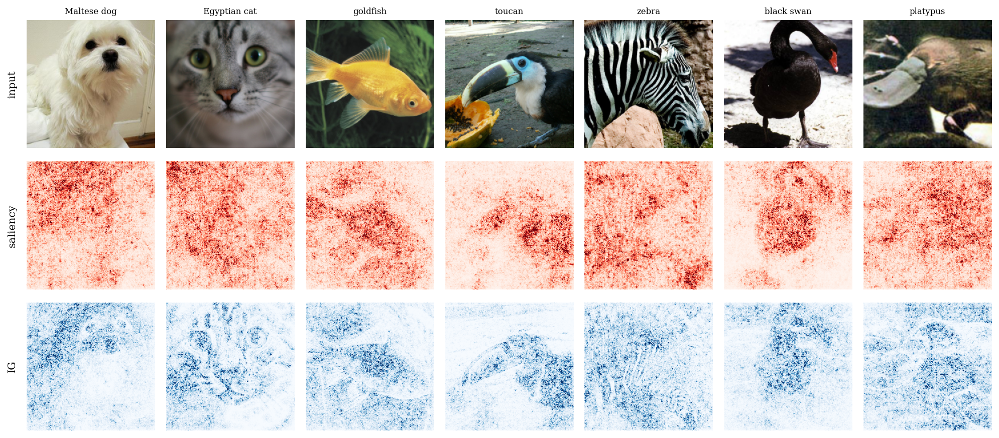

In [374]:
def saliency_map(model, x, target):
    """x: (C, H, W). Returns (H, W): |gradient|, max over color channels."""
    x = x.clone().detach().to(device).requires_grad_(True)  # gradients on pixels
    model(x.unsqueeze(0))[0, target].backward()             # one backward pass
    return x.grad.abs().amax(0).cpu()                       # channel max -> 2D


def integrated_gradients_img(model, x, target, baseline=None, steps=64):
    """x: (C, H, W). Returns (H, W): signed IG, summed over color channels."""
    x = x.to(device)
    if baseline is None:
        baseline = torch.zeros_like(x)           # black image = "no signal"
    # midpoint alphas, as in the toy implementation
    alphas = torch.linspace(0, 1, steps + 1, device=device)[:-1] + 0.5 / steps
    # all path points stacked into one batch: (steps, C, H, W)
    path = baseline + alphas[:, None, None, None] * (x - baseline)
    path.requires_grad_(True)
    # .sum() makes the output scalar; each path point only affects its own
    # logit -> per-point gradients in a single backward pass
    grads = torch.autograd.grad(model(path)[:, target].sum(), path)[0]
    # displacement x mean path gradient, then channel sum -> 2D signed map
    return ((x - baseline) * grads.mean(0)).sum(0).detach().cpu()


sal_maps = [saliency_map(model, img, p) for img, p in zip(examples, preds)]
ig_maps = [integrated_gradients_img(model, img, p, steps=IG_STEPS)
           for img, p in zip(examples, preds)]

fig, axes = plt.subplots(3, len(examples), figsize=(1.9 * len(examples), 6))
for j in range(len(examples)):
    im, cmap = display_img(examples[j])          # dataset-appropriate display
    axes[0, j].imshow(im, cmap=cmap)
    axes[0, j].set_title(CLASS_NAMES[preds[j]][:16], fontsize=8)
    for r, amap, cmap_a in [(1, sal_maps[j], "Reds"),
                            (2, ig_maps[j].abs(), "Blues")]:
        # sharp contrast: saturate the colormap at the 99th percentile,
        # so everything with real attribution shows up DARK
        vmax = torch.quantile(amap.flatten(), 0.99)
        axes[r, j].imshow(amap, cmap=cmap_a, vmin=0, vmax=vmax)
    for r in range(3):
        axes[r, j].axis("off")
for r, label in enumerate(["input", "saliency", "IG"]):
    axes[r, 0].text(-0.15, 0.5, label, transform=axes[r, 0].transAxes,
                    rotation=90, va="center", fontsize=10)
plt.tight_layout()
plt.show()

<div style="border-left: 4px solid #4CAF50; padding-left: 1em; padding-top: 1em; padding-bottom: 1em; margin: 1em 0; background: #e8f5e9; color: #1a1a1a;">

**NOTE:** Thanks to the $(x - x')$ factor, IG is exactly zero wherever the image equals the baseline — the background stays perfectly clean. The **baseline is part of the question** — a different baseline asks a different question.

</div>

<div style="border-left: 5px solid #FFA500; background-color: rgba(255, 165, 0, 0.15); padding: 10px; border-radius: 4px; color: inherit;">

<font size=4>**Question**</font>

Same model, same images — why is vanilla saliency so much **noisier** than IG?

</div>

<div style="border-left: 4px solid #e57373; padding-left: 1em; padding-top: 1em; padding-bottom: 1em; margin: 1em 0; background: #fdecea; color: #1a1a1a;">
<details>

<b><summary>[Spoiler] (click here to expand)</summary></b>

A ReLU network is piecewise linear: tiny input changes flip ReLUs on/off and the <b>local gradient jumps around</b>. Saliency reads that jittery gradient at a single point. IG <b>averages gradients over the whole path</b> (smoothing the jitter) and multiplies by $(x - x')$, which silences the background. <i>SmoothGrad</i> (Smilkov et al. 2017) achieves a similar smoothing by averaging saliency over noisy copies of the input instead.

</details>
</div>

## Smoothing IG with a Noise Tunnel

Attributions can sometimes be visually noisy or hyper-sensitive to tiny artifacts in the input image. To fix this, we can compute our attributions using **Integrated Gradients (IG)** and smooth them out by passing the input through a **Noise Tunnel**. 

Here is how the process works:
1. We add standard Gaussian noise to the input image.
2. We repeat this $N=10$ times (`nt_samples=10`) to create a batch of noisy variations.
3. We compute the IG attributions for every single noisy sample.
4. We aggregate them using the **`smoothgrad_sq`** technique, which takes the **mean of the squared attributions** — then take a final square root, purely for display.

Mathematically, the textbook `smoothgrad_sq` (Hooker et al. 2019; Captum's `nt_type="smoothgrad_sq"`) is:

$$\mathrm{NT}_i(x) = \frac{1}{N} \sum_{n=1}^{N} \mathrm{IG}_i \big(x + \varepsilon_n \big)^2, \qquad \varepsilon_n \sim \mathcal{N}(0, 1), \quad N=10$$

and that is exactly what `ig_noise_tunnel` computes internally. We then take one extra step, $\sqrt{\mathrm{NT}_i(x)}$ (an RMS, not the raw quantity above), purely so the result sits on the same **magnitude** scale as plain `|IG|` for the side-by-side plot below. — it lives on a squared/variance scale by design, so it isn't meant to look directly comparable to plain IG in the first place; if faint structure looks like it "vanishes" without the sqrt, that's the estimator behaving as intended, not a bug.

**Why is squaring effective in the first place?**
$\rightarrow$ Attributions that **survive the noise** represent robust, meaningful structure, while random pixel-level jitter naturally averages away. Squaring the values makes the final maps positive by construction and emphasizes the strongest, most reliable signals even further.

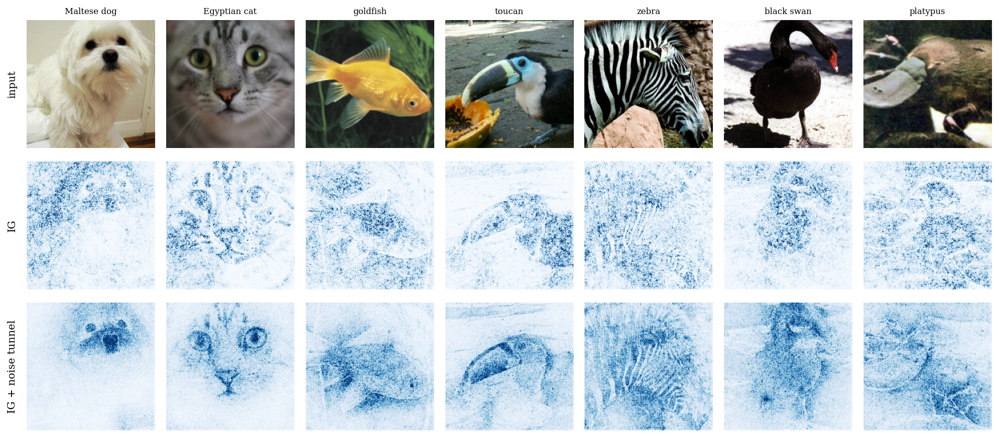

In [376]:
def ig_noise_tunnel(model, x, target, nt_samples=10, stdev=1, steps=32):
    """Noise tunnel over IG with the `smoothgrad_sq` rule:
    root-mean-square of the SQUARED IG maps across nt_samples noisy copies of x.

    The final sqrt matters: squaring then averaging shrinks small values far more
    than large ones (0.2^2 is 25x smaller than 1.0^2, not just 5x), so without it
    faint-but-real attribution can vanish next to strong peaks once displayed.
    """
    attrs = []
    for _ in range(nt_samples):
        noisy = x + stdev * torch.randn_like(x)      # gaussian noise, sd = 1
        attrs.append(integrated_gradients_img(model, noisy, target,
                                              steps=steps) ** 2)
    return torch.stack(attrs).mean(0).sqrt()         # RMS, not raw MSE (see above)


# NOTE: this runs nt_samples x IG per image -- with IMAGENET on CPU it can
# take a few minutes; reduce nt_samples if pressed for time.
nt_maps = [ig_noise_tunnel(model, img, p, nt_samples=10, steps=IG_STEPS)
           for img, p in zip(examples, preds)]

fig, axes = plt.subplots(3, len(examples), figsize=(1.9 * len(examples), 6))
for j in range(len(examples)):
    im, cmap = display_img(examples[j])
    axes[0, j].imshow(im, cmap=cmap)
    axes[0, j].set_title(CLASS_NAMES[preds[j]][:16], fontsize=8)
    for r, amap in [(1, ig_maps[j].abs()), (2, nt_maps[j])]:
        vmax = torch.quantile(amap.flatten(), 0.99)  # sharp contrast
        axes[r, j].imshow(amap, cmap="Blues", vmin=0, vmax=vmax)
    for r in range(3):
        axes[r, j].axis("off")
for r, label in enumerate(["input", "IG", "IG + noise tunnel"]):
    axes[r, 0].text(-0.15, 0.5, label, transform=axes[r, 0].transAxes,
                    rotation=90, va="center", fontsize=10)
plt.tight_layout()
plt.show()

# Mechanistic Interpretability: Finding the Circuits

So far, we have attributed predictions to the **inputs**: Saliency maps and Integrated Gradients tell us *where the model looked*. 

**Mechanistic interpretability** takes a different approach. Instead of looking at the input, it explains the prediction through the network's **internal structure**. The central object of study here is the **circuit**: *the minimal subnetwork of features and weights responsible for a specific behavior* (Olah et al., 2020).


## How a Circuit Forms, Layer by Layer

Think of a neural network as **layers of feature detectors wired together**. Instead of treating the network as a single black box, we can trace the responsibility for a prediction backwards through its internal components:

*   **The Final Layer (Direct Translation):** 
    The final output (the logit) is literally just a linear weighted sum of the activations from the penultimate layer:
    
    $$ \mathrm{logit}_c = \sum_i W_{c,i} \, a_i + b_c $$
    
    $\rightarrow$ Unit $i$ contributes **exactly** $W_{c,i} \, a_i$. You can just read off the addends! The units with the largest values are the founding members of our circuit at the very end of the network.

*   **One Layer Deeper (Activation $\times$ Gradient):** 
    Each of those late-stage units is computed from the previous layer's channels using weights, ReLUs, and pooling. Because of these non-linearities, the logit is *no longer a simple linear sum* of these deeper units. 
    However, we can estimate each channel's contribution using **Activation $\times$ Gradient**:
    *(how active the unit actually was)* $\times$ *(how much the final logit reacts to it)*.

*   **...And So On, Backwards:** 
    By repeating this argument stage by stage, we trace the responsibility from the logit, through the dense layers, through the convolutions, all the way back to the pixels (where it finally meets the input attributions from the first half of this notebook!).

### Putting It Together

A **circuit** is simply the subgraph you are left with when you keep only the few units at every stage that carry the most contribution. 

These members *connect naturally across layers*. A late-stage unit scores highly precisely **because** it reads from strongly contributing earlier units. The specific wiring between these members is where the actual computation ("the algorithm") happens.

$\rightarrow$ Enough words. Let's **draw** it.

### Which neurons matter, layer by layer?

Before drawing the full circuit, let's find its pieces by hand: for one **category**, average `gradient × activation` over several of its test images to rank each layer's neurons by how much they support that class *in general* — a **class-general** circuit. Then pick one (layer, neuron) and look at its **favorite images** — the test images that activate it the most — to see what it actually detects.

Keep this distinction in mind for what follows: the circuit diagram below scores a **single image** instead of averaging over the class — an **instance-specific** circuit. The two often overlap (the neurons found here should show up again as circuit members), but they don't have to: a neuron can matter for the class on average without being the one driving *this particular* prediction, or vice versa.

In [377]:
# ---- top neurons per layer, for one category ---------------------------
# needs many examples of the SAME class to average over -- only the MNIST
# branch has a full test set here (ImageNet demo has ~1 image/class)
if DATASET == "MNIST":
    CATEGORY = preds[0]                            # matches the image "Drawing the circuit" uses below

    cat_idx = [i for i in range(len(test_ds)) if test_ds[i][1] == CATEGORY][:64]
    cat_imgs = torch.stack([test_ds[i][0] for i in cat_idx]).to(device)

    # forward pass, keeping intermediate activations for the WHOLE batch
    a1 = F.max_pool2d(F.relu(model.conv1(cat_imgs)), 2)      # (N, 16, 14, 14)
    a2 = F.max_pool2d(F.relu(model.conv2(a1)), 2)            # (N, 32, 7, 7)
    a3 = F.relu(model.fc1(a2.flatten(1)))                    # (N, 128)
    logits_batch = model.fc2(a3)                             # (N, 10)
    stages = [("conv1", a1), ("conv2", a2), ("fc1", a3)]

    logit_cat = logits_batch[:, CATEGORY].sum()              # sum -> one scalar per stage
    grads = torch.autograd.grad(logit_cat, [t for _, t in stages])

    print(f"top neurons per layer for category '{CLASS_NAMES[CATEGORY]}' "
          f"(averaged over {len(cat_idx)} test images):")
    top_by_layer = {}                                        # name -> top-5 neuron indices
    for (name, t), g in zip(stages, grads):
        s = (g * t)                                          # (N, C, H, W) or (N, C)
        s = s.sum((-2, -1)) if s.dim() == 4 else s            # -> (N, C) contribution density
        mean_score = s.mean(0).detach().cpu()                # average over the category's images
        abs_score = mean_score.abs()
        norm_score = abs_score / abs_score.max().clamp(min=1e-8)   # -> [0, 1] within this layer
        top5 = abs_score.topk(5).indices.tolist()
        top_by_layer[name] = top5
        print(f"  {name:6s}: {top5}   "
              f"(normalised |score| 0-1: {[round(norm_score[i].item(), 3) for i in top5]})")
else:
    print("skipping -- needs many examples per class, only set up for MNIST here")

skipping -- needs many examples per class, only set up for MNIST here


In [378]:
# ---- 3x3 grid: which images does ONE chosen neuron care about most? ----
if DATASET == "MNIST":
    LAYER, NEURON = "conv2", top_by_layer["conv2"][0]   # <- pick a layer + neuron from the printout above

    def layer_activations(x):
        a1 = F.max_pool2d(F.relu(model.conv1(x)), 2)
        a2 = F.max_pool2d(F.relu(model.conv2(a1)), 2)
        a3 = F.relu(model.fc1(a2.flatten(1)))
        return {"conv1": a1, "conv2": a2, "fc1": a3}[LAYER]

    with torch.no_grad():
        acts_all = torch.cat([layer_activations(xb.to(device)) for xb, _ in test_dl]).cpu()

    # spatial layers (conv1/conv2): average activation over space -> one score per image
    neuron_acts = acts_all[:, NEURON]
    neuron_scores = neuron_acts.mean((-2, -1)) if neuron_acts.dim() == 3 else neuron_acts

    fav = neuron_scores.topk(9).indices
    fig, axes = plt.subplots(3, 3, figsize=(4.5, 4.8))
    for ax, idx in zip(axes.flat, fav):
        ax.imshow(test_ds[idx][0].squeeze(), cmap="gray")
        ax.axis("off")
    fig.suptitle(f"{LAYER} neuron {NEURON}'s favorite images (highest activation)")
    plt.tight_layout()
    plt.show()
else:
    print("skipping -- needs a full test set to search, only set up for MNIST here")

skipping -- needs a full test set to search, only set up for MNIST here


### Drawing the circuit

One node per channel/unit, **circuit members highlighted**, everything else greyed out. Members of the early (convolutional) stages are drawn as their **activation map on this very input** — you literally see *where* each filter fires. The frame/edge colors give the **sign** (red supports the class, blue opposes).

Scores are gradient $\times$ activation: **exact** for the last stage (the logit is linear in it), a first-order estimate earlier. Edges between hidden stages show *membership* (the wiring is dense); the edges into the logit are the **exact** last-layer contributions (same fixed width as the other membership edges, color still gives the sign).

This is the **instance-specific** circuit for one image — contrast it with the **class-general** top neurons found above by averaging over many images of the category: see which neurons reappear here as circuit members.

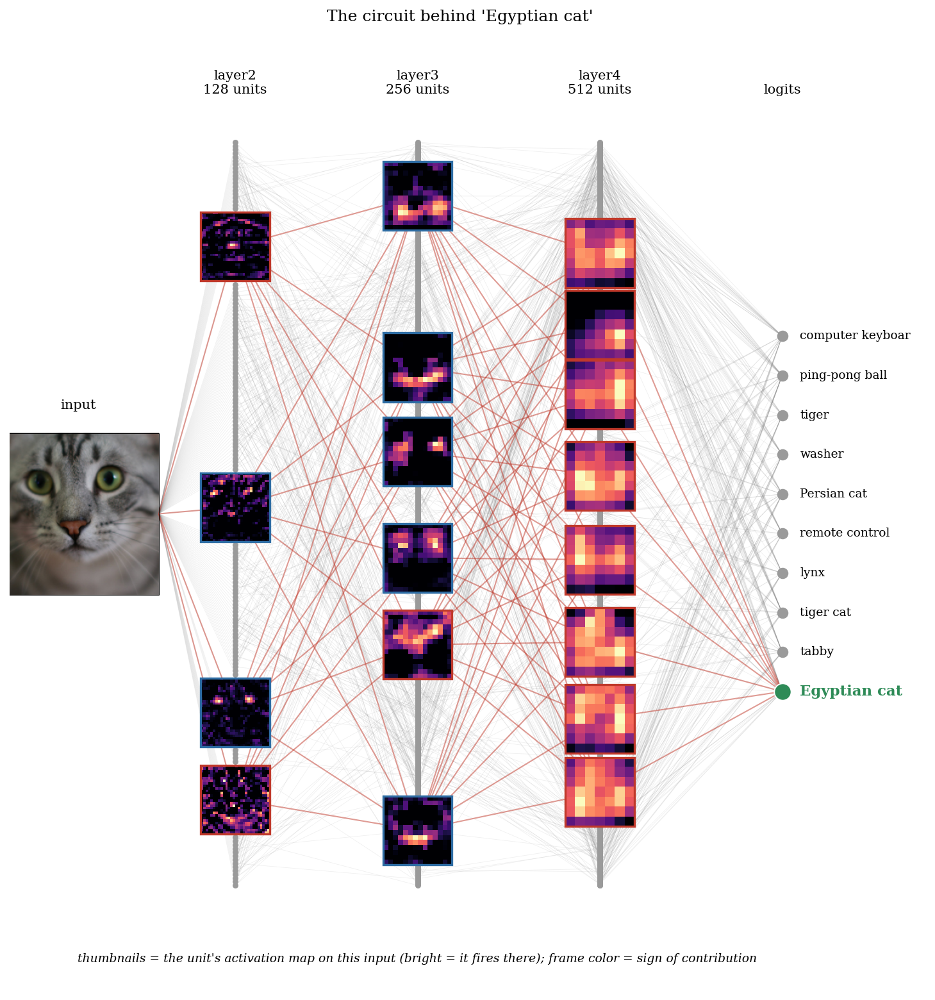

[[108, 14, 56, 19],
 [120, 149, 161, 106, 240, 16],
 [156, 167, 225, 309, 189, 298, 301, 265]]

In [391]:
from matplotlib.patches import Rectangle
from matplotlib.collections import LineCollection


def draw_circuit(stages, logits_vec, p, class_names, img,
                  input_display=None, top_k=None, figsize=(10, 10.5)):
    """Generic circuit diagram: gradient x activation scoring, top-k members
    per stage kept as the circuit, drawn with their own activation map as a
    thumbnail (non-spatial stages get a plain colored dot instead).

    stages:  list of (name, activation_tensor) pairs, in forward order,
             EXCLUDING the final logits -- e.g. [("conv1", a1), ("fc1", a3)].
    logits_vec: the full (num_classes,) logits tensor these stages feed into.
    p:       the predicted/target class index (row highlighted in green).
    class_names: list of class names.
    img:     the raw input tensor, only used for the top-left thumbnail.
    input_display: (array, cmap) for the input thumbnail; defaults to
             img.squeeze() in grayscale.
    top_k:   list of ints, one per stage (top |score| units to keep as
             circuit members); defaults to min(6, stage_size) per stage.
    """
    logit_p = logits_vec[p]                              # the scalar we explain

    # contribution score per channel/unit: gradient x activation -- exact
    # for the LAST stage (logit linear in it), first-order estimate earlier;
    # conv maps are summed over spatial positions -> one score per CHANNEL
    grads = torch.autograd.grad(logit_p, [t for _, t in stages])
    layer_scores = []
    for (name, t), g in zip(stages, grads):
        s = (g * t).squeeze(0)                           # contribution density
        layer_scores.append((s.sum((-2, -1)) if s.dim() == 3 else s).detach().cpu())

    # the circuit: top-k units by |score| in each stage
    if top_k is None:
        top_k = [min(6, len(s)) for s in layer_scores]
    tops = [s.abs().topk(k).indices.tolist() for s, k in zip(layer_scores, top_k)]

    # activation maps for the thumbnails (None for non-spatial stages)
    fmaps = [t[0].detach().cpu().numpy() if t.dim() == 4 else None
             for _, t in stages]

    # output column: all classes, or the top-10 logits if there are many
    if len(class_names) <= 10:
        out_ids = list(range(len(class_names)))
    else:
        out_ids = logits_vec.topk(10).indices.tolist()
    p_row = out_ids.index(p)                             # where to highlight

    # layout: columns auto-spaced over a fixed total width, however many stages
    n_stages = len(stages)
    cols = np.linspace(1.7, 5.7, n_stages + 1).tolist()  # x of the node columns

    # data-unit -> inches scale (this Axes is not aspect-equal), so a "square"
    # box on screen needs different widths and heights in data units
    x_range = (cols[-1] + 1.05) - 0.05                # xlim span
    y_range = 1.10 - (-0.09)                          # ylim span
    x_scale, y_scale = figsize[0] / x_range, figsize[1] / y_range
    names = [f"{name}\n{len(s)} units" for (name, _), s in zip(stages, layer_scores)]
    names.append("logits")
    sizes = [len(s) for s in layer_scores]
    ys_out = np.linspace(0.28, 0.72, len(out_ids))

    # thumbnail size in data units: TH is the free choice, TW is derived so
    # the thumbnail is an actual SQUARE on screen (activation maps are square)
    TH = 0.085
    TW = TH * (y_scale / x_scale)

    def column_positions(n, members, th, y0=0.04, y1=0.96):
        """Equal edge-to-edge gaps: dots are points, thumbnails occupy th."""
        heights = [th if i in set(members) else 0.0 for i in range(n)]
        gap = (y1 - y0 - sum(heights)) / (n - 1)
        ys, y = [], y0
        for hh in heights:
            ys.append(y + hh / 2)
            y += hh + gap
        return ys

    pos = [dict(enumerate(column_positions(sizes[L],
                                           tops[L] if fmaps[L] is not None else [],
                                           TH)))
           for L in range(n_stages)]

    C_POS, C_NEG = "#c0392b", "#2e6da4"                  # supports / opposes
    C_PRED, C_OFF = "#2e8b57", "#9a9a9a"                 # prediction / rest

    if input_display is None:
        input_display = (img.squeeze(), "gray")
    im_disp, cmap_disp = input_display

    with plt.rc_context({"font.family": "serif"}):
        fig, ax = plt.subplots(figsize=figsize)

        # -- input image, square, thin border, vertically centered ---------
        in_h = 0.20                                       # data units (smaller)
        in_w = in_h * (y_scale / x_scale)                 # -> visually square
        in_cx, in_cy = 0.55, 0.5                           # centered vertically
        in_ext = (in_cx - in_w / 2, in_cx + in_w / 2, in_cy - in_h / 2, in_cy + in_h / 2)
        ax.imshow(im_disp, cmap=cmap_disp, aspect="equal",
                  extent=in_ext, zorder=2)
        ax.add_patch(Rectangle((in_ext[0], in_ext[2]),
                               in_ext[1] - in_ext[0], in_ext[3] - in_ext[2],
                               fill=False, edgecolor="black", lw=0.5, zorder=3))
        ax.text(in_cx, in_ext[3] + 0.03, "input", ha="center", fontsize=10)

        # -- edges: a SUBSET of the dense wiring (faint) + the circuit (red) --
        # drawing every pair would be up to ~10^5 lines; a random sample of a
        # few hundred per layer conveys the same "dense mesh" impression
        rng = np.random.default_rng(0)

        def sample_pairs(n_i, n_j, n_max=400):
            ii = rng.integers(0, n_i, size=min(n_max, n_i * n_j))
            jj = rng.integers(0, n_j, size=len(ii))
            return zip(ii.tolist(), jj.tolist())

        segs = [[(in_ext[1], in_cy), (cols[0], pos[0][i])] for i in range(sizes[0])]
        for L in range(n_stages - 1):
            segs += [[(cols[L], pos[L][i]), (cols[L + 1], pos[L + 1][j])]
                     for i, j in sample_pairs(sizes[L], sizes[L + 1])]
        segs += [[(cols[n_stages - 1], pos[-1][i]), (cols[-1], ys_out[d])]
                 for i, d in sample_pairs(sizes[-1], len(out_ids))]
        ax.add_collection(LineCollection(segs, colors="gray", linewidths=0.4,
                                         alpha=0.12, zorder=1))

        red = [[(in_ext[1], in_cy), (cols[0], pos[0][i])] for i in tops[0]]
        for L in range(n_stages - 1):
            red += [[(cols[L], pos[L][i]), (cols[L + 1], pos[L + 1][j])]
                    for i in tops[L] for j in tops[L + 1]]
        ax.add_collection(LineCollection(red, colors=C_POS, linewidths=1.0,
                                         alpha=0.5, zorder=2))

        # last stage -> predicted logit: EXACT contributions (color = sign),
        # same fixed width as the earlier membership edges for visual consistency
        for i in tops[-1]:
            s = layer_scores[-1][i]
            ax.plot([cols[n_stages - 1], cols[-1]],
                    [pos[-1][i], ys_out[p_row]],
                    c=C_POS if s > 0 else C_NEG,
                    alpha=0.5, lw=1.0, zorder=2)

        # -- nodes ----------------------------------------------------------
        for L in range(n_stages):
            rest = [i for i in range(sizes[L]) if i not in tops[L]]
            ax.scatter([cols[L]] * len(rest), [pos[L][i] for i in rest],
                       s=11, c=C_OFF, zorder=3)
            for i in tops[L]:
                if fmaps[L] is not None:               # spatial: activation map
                    cx, cy = cols[L], pos[L][i]
                    ext = (cx - TW / 2, cx + TW / 2, cy - TH / 2, cy + TH / 2)
                    ax.imshow(fmaps[L][i], cmap="magma", aspect="auto",
                              extent=ext, zorder=5)
                    ax.add_patch(Rectangle((ext[0], ext[2]), TW, TH, fill=False,
                                           edgecolor=C_POS if layer_scores[L][i] > 0 else C_NEG,
                                           lw=1.6, zorder=6))
                else:                                  # non-spatial: colored dot
                    ax.scatter(cols[L], pos[L][i], s=85,
                               c=C_POS if layer_scores[L][i] > 0 else C_NEG,
                               edgecolors="white", linewidths=0.7, zorder=4)

        # logit nodes; the predicted class bold & green
        ax.scatter([cols[-1]] * len(out_ids), ys_out, s=55, c=C_OFF, zorder=3)
        ax.scatter(cols[-1], ys_out[p_row], s=160, c=C_PRED,
                   edgecolors="white", linewidths=0.9, zorder=4)
        for row, d in enumerate(out_ids):
            ax.text(cols[-1] + 0.13, ys_out[row], str(class_names[d])[:16],
                    va="center",
                    fontsize=11 if d == p else 9,
                    color=C_PRED if d == p else "black",
                    fontweight="bold" if d == p else "normal")

        # -- titles & cosmetics ----------------------------------------------
        for x_, name in zip(cols, names):
            ax.text(x_, 1.02, name, ha="center", fontsize=10)
        ax.text(cols[n_stages // 2], -0.055,
                "thumbnails = the unit's activation map on this input "
                "(bright = it fires there); frame color = sign of contribution",
                ha="center", fontsize=9, style="italic")

        ax.set_xlim(0.05, cols[-1] + 1.05)
        ax.set_ylim(-0.09, 1.10)
        ax.axis("off")
        ax.set_title(f"The circuit behind '{class_names[p]}'   ", fontsize=12)
        plt.tight_layout()
        plt.show()

    return tops   # per-stage circuit membership (indices), for reuse (e.g. ablation)


# =====================================================================
# use it: the circuit diagram for ONE image (`img`, predicted class `p`)
# =====================================================================
# pick the Egyptian cat for ImageNet (falls back to the first example for MNIST)
if DATASET == "IMAGENET":
    idx = true_labels.index(CLASS_NAMES.index("Egyptian cat"))
else:
    idx = 0
img, p = examples[idx], preds[idx]
x = img.unsqueeze(0).to(device)

# forward pass, keeping the intermediate activations (so autograd can give
# us gradients w.r.t. each stage)
if DATASET == "MNIST":
    a1 = F.max_pool2d(F.relu(model.conv1(x)), 2)     # (1, 16, 14, 14)
    a2 = F.max_pool2d(F.relu(model.conv2(a1)), 2)    # (1, 32, 7, 7)
    a3 = F.relu(model.fc1(a2.flatten(1)))            # (1, 128)
    logits_vec = model.fc2(a3)[0]                    # (10,)
    stages = [("conv1", a1), ("conv2", a2), ("fc1", a3)]
    top_k = [4, 6, 8]
else:
    m = model                                        # ResNet-18 stages
    h = m.maxpool(m.relu(m.bn1(m.conv1(x))))
    l1 = m.layer1(h)
    l2 = m.layer2(l1)                                # (1, 128, 28, 28)
    l3 = m.layer3(l2)                                # (1, 256, 14, 14)
    l4 = m.layer4(l3)                                # (1, 512, 7, 7)
    feat = m.avgpool(l4).flatten(1)                  # (1, 512)
    logits_vec = m.fc(feat)[0]                       # (1000,)
    stages = [("layer2", l2), ("layer3", l3), ("layer4", l4)]
    top_k = [4, 6, 8]

draw_circuit(stages, logits_vec, p, CLASS_NAMES, img,
             input_display=display_img(img), top_k=top_k)

### Need to do a bit more for the mechanistic interpretability stuff

<div style="border-left: 4px solid #4CAF50; padding-left: 1em; padding-top: 1em; padding-bottom: 1em; margin: 1em 0; background: #e8f5e9; color: #1a1a1a;">

**NOTE:** Read it left to right: the faint grey mesh is everything the network *could* use; the red thread is what it *did* use — early feature maps firing on the relevant structure, combined into later units, funneled (exactly, at the last step) into the class logit.

One warning before over-interpreting: *which* units make the circuit depends on the data used to score them. **Certified circuits** (Anani et al. 2026) keep only members that are provably **stable** under changes of that data — the unstable rest often turn out to be spurious cues.

</div>

# Astrophysical Case Study: Galaxy Morphology

### I made this toy dataset for this lecture, just essentially images looking like idealised galaxies with distinct morphologies. for the school I will have this code I think and have the students generate test samples (known seed) of the different types of systems and use my pre-trained model to classify and do the interpretability. I will reduce the fluff and all more, of course.

**Morphology** is one of the oldest observables in extragalactic astronomy. Hubble's sequence separates smooth, pressure-supported **ellipticals** from rotation-supported **spirals**; **bars** mark disk instabilities that funnel gas toward the center, while **mergers** capture the transformative, chaotic gravitational interactions between systems. Morphology correlates with color, star-formation history, and environment — so measuring it *at survey scale* is real science.

But modern surveys (SDSS, Euclid, LSST) deliver far more galaxies than humans can inspect. Galaxy Zoo answered with citizen science; today we increasingly answer with CNNs — which brings us straight back to this lecture: a classifier used for science needs **evidence that it classifies on morphology** (arms, bars, tidal tails, light profiles) and not on artifacts or background clutter.

We work on generated **toy galaxies**, so the lab runs anywhere with no download. We simulate four classes:

- **elliptical** — smooth Sersic light profile, random elongation, and subtle structural asymmetry
- **spiral** — bright bulge, disk, and a variable number of sweeping arms (2 to 4)
- **barred spiral** — central bar with two unwinding arms growing out of its ends
- **merger** — interacting pairs (spiral-spiral, elliptical-elliptical, or spiral-barred) featuring tidal bridges, shared envelopes, and disrupted tails

Each simulated galaxy features randomized orientation, inclination, bulge size, and zoom. They are embedded in a pseudo-realistic field of view containing observation noise, faint point-source stars, and smaller satellite galaxies.

→ The guiding *scientific* question throughout: **does the network use the intrinsic morphological features (the arms, the bar, the tidal interactions)?**

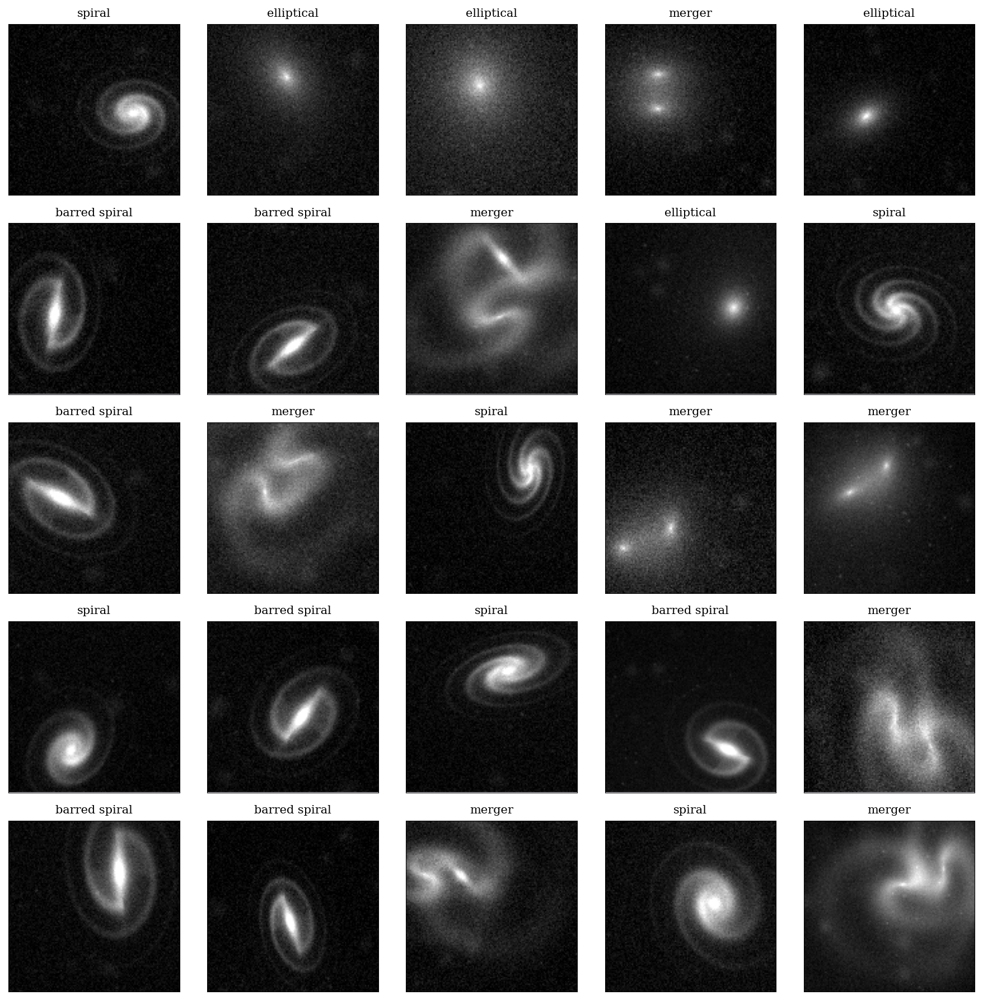

In [381]:
import torch
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams.update({
    "font.family": "serif",
    "text.color": "black",
    "axes.labelcolor": "black",
    "axes.titlecolor": "black",
    "xtick.color": "black",
    "ytick.color": "black",
    "figure.dpi": 150,        # crisp text/numbers on screen (default 100 looks pixelated)
    "savefig.dpi": 150,
})

def clean_axis(ax):
    """No ticks, but keep a thin black frame around the subplot."""
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(0.5)
        spine.set_color("black")

def make_galaxy(kind, size=64):
    """Toy galaxy image with explicit Sersic profiles.

    kind 0 = elliptical      
    kind 1 = spiral          
    kind 2 = barred spiral   
    kind 3 = merger          (Sub-types: S-S, E-E, S-B with tidal effects)
    
    size : Controls pixel resolution
    """
    yy, xx = torch.meshgrid(torch.linspace(-1, 1, size),
                            torch.linspace(-1, 1, size), indexing="ij")

    # --- ZOOM & OFFSET (PANNING) ---
    zoom = float(0.6 + 0.4 * torch.rand(1))
    offset_x = float(0.6 * (torch.rand(1) - 0.5) * 2)
    offset_y = float(0.6 * (torch.rand(1) - 0.5) * 2)
    
    xx = (xx - offset_x) / zoom
    yy = (yy - offset_y) / zoom

    img = torch.zeros_like(xx)
    spin_dir = 1.0 if torch.rand(1).item() > 0.5 else -1.0

    if kind in [0, 1, 2]:
        # --- ISOLATED GALAXIES ---
        pa = float(2 * np.pi * torch.rand(1))            
        q = float(0.55 + 0.35 * torch.rand(1))           
        xr = xx * np.cos(pa) + yy * np.sin(pa)
        yr = (-xx * np.sin(pa) + yy * np.cos(pa)) / q    
        r = (xr ** 2 + yr ** 2).sqrt() + 1e-6            
        theta = torch.atan2(yr, xr)                      
        w = 0.12 + 0.06 * torch.rand(1)                  

        # --- INTRINSIC ASYMMETRY / TIDAL WARPS ---
        # Generate random phases for the asymmetric distortions
        warp_phase1 = float(2 * np.pi * torch.rand(1))
        warp_phase2 = float(2 * np.pi * torch.rand(1))
        
        # Amplitude of distortion: m=1 (lopsidedness), m=2 (oval distortion)
        # We use tanh so the bright dense core remains stable while the outer disk warps
        w_amp1 = float(0.04 + 0.06 * torch.rand(1)) 
        w_amp2 = float(0.02 + 0.05 * torch.rand(1))
        
        warp_factor = 1.0 + torch.tanh(r / 0.15) * (w_amp1 * torch.sin(theta + warp_phase1) + w_amp2 * torch.sin(2 * theta + warp_phase2))
        r_warped = r * warp_factor
        
        # Brightness asymmetry so one side/arm is naturally a bit brighter (like real galaxies)
        brightness_asym = 1.0 + 0.25 * torch.sin(theta + warp_phase1)

        if kind == 0:                                    
            n_bulge = float(0.8 + 0.7 * torch.rand(1))   
            n_halo  = float(0.5 + 1.0 * torch.rand(1))   
            bulge_amp = float(1.5 + 1.5 * torch.rand(1)) 
            
            # The core remains symmetric (r), but the extended halo is warped (r_warped)
            img = bulge_amp * torch.exp(-(r / w) ** (1.0 / n_bulge)) + \
                  0.5 * brightness_asym * torch.exp(-(r_warped / 0.5) ** (1.0 / n_halo))
            
        elif kind == 1:
            n_bulge, n_disk, bulge_amp = 1, 1.0, 3.8
            img = bulge_amp * torch.exp(-(r / w) ** (1.0 / n_bulge)) + \
                  0.25 * brightness_asym * torch.exp(-(r_warped / 0.35) ** (1.0 / n_disk))
            
            n_arms = int(torch.randint(2, 5, (1,)))                
            arm_fade_rate = float(0.25 + 0.10 * torch.rand(1))     
            pitch = float(15 + 10 * torch.rand(1))        
            phase = float(2 * np.pi * torch.rand(1))
            arm_start = w                            
            
            # Use warped radius for arm calculation to create organic, imperfect spirals
            dr = (r_warped - arm_start).clamp(min=0)
            arm_mask = torch.sigmoid((r_warped - arm_start) * 30.0)
            phi = n_arms * theta - spin_dir * pitch * dr + phase
            arm_fade = torch.exp(-dr / arm_fade_rate)
            arm_width = 3 * torch.exp(-dr / arm_fade_rate).clamp(min=0.04)
            
            # Apply brightness asymmetry directly to the arms
            img += 1.8 * brightness_asym * arm_fade * torch.exp((torch.cos(phi) - 1) / arm_width) * arm_mask
            
        elif kind == 2:
            n_bulge, n_disk, bulge_amp = 1.2, 0.5, 2.8
            img = bulge_amp * torch.exp(-(r / w) ** (1.0 / n_bulge)) + \
                  0.25 * brightness_asym * torch.exp(-(r_warped / 0.35) ** (1.0 / n_disk))
            
            n_arms = 2
            bar_len = float(0.35 + 0.10 * torch.rand(1)) 
            img += 1.8 * torch.exp(-(xr / bar_len) ** 2 - (yr / 0.12) ** 2)

            arm_start = bar_len 
            pitch = float(12 + 10 * torch.rand(1))
            dr = (r_warped - arm_start).clamp(min=0)
            arm_mask = torch.sigmoid((r_warped - arm_start) * 15.0)

            phi = n_arms * theta - spin_dir * pitch * dr
            arm_fade = torch.exp(-dr / 0.25)
            arm_width = 2 * torch.exp(-dr / 0.3).clamp(min=0.08)
            
            directional_mask = torch.clamp(
                torch.sigmoid((spin_dir * torch.sin(n_arms * theta) + 0.2) * 20.0) + (dr / 0.25), 0.0, 1.0)
            
            img += (bulge_amp * 0.55) * brightness_asym * arm_fade * torch.exp((torch.cos(phi) - 1) / arm_width) * arm_mask * directional_mask

    elif kind == 3:
        # --- MERGER SYSTEMS ---
        merger_subtype = int(torch.randint(0, 3, (1,))) 
        
        sep = float(0.2 + 0.2 * torch.rand(1))
        angle = float(2 * np.pi * torch.rand(1))
        dx, dy = sep * np.cos(angle), sep * np.sin(angle)
        
        def get_local_coords(x_shift, y_shift):
            pa = float(2 * np.pi * torch.rand(1))            
            q = float(0.5 + 0.4 * torch.rand(1))           
            xl = (xx - x_shift) * np.cos(pa) + (yy - y_shift) * np.sin(pa)
            yl = (-(xx - x_shift) * np.sin(pa) + (yy - y_shift) * np.cos(pa)) / q    
            rl = (xl ** 2 + yl ** 2).sqrt() + 1e-6            
            thl = torch.atan2(yl, xl)
            return xl, yl, rl, thl

        xa, ya, ra, tha = get_local_coords(dx, dy)
        xb, yb, rb, thb = get_local_coords(-dx, -dy)

        wa = 0.08 + 0.04 * torch.rand(1)
        wb = 0.08 + 0.04 * torch.rand(1)
        
        ampa = float(1.5 + 0.8 * torch.rand(1))
        ampb = float(1.5 + 0.8 * torch.rand(1))
        
        img_a = torch.zeros_like(xx)
        img_b = torch.zeros_like(xx)

        if merger_subtype == 0:
            # -- Spiral-Spiral Merger --
            img_a = ampa * torch.exp(-(ra/wa)**(1.0/1.2)) + 0.25 * torch.exp(-(ra/0.3)**(1.0/1.0))
            img_b = ampb * torch.exp(-(rb/wb)**(1.0/1.2)) + 0.25 * torch.exp(-(rb/0.3)**(1.0/1.0))
            
            dra = (ra - wa).clamp(min=0)
            phia = 2 * tha - spin_dir * 5.0 * dra
            img_a += 1.4 * torch.exp(-dra/0.8) * torch.exp((torch.cos(phia)-1)/1.5) * torch.sigmoid((ra-wa)*20.0)
            
            drb = (rb - wb).clamp(min=0)
            phib = 2 * thb - (-spin_dir) * 6.0 * drb 
            img_b += 1.3 * torch.exp(-drb/0.7) * torch.exp((torch.cos(phib)-1)/1.5) * torch.sigmoid((rb-wb)*20.0)

        elif merger_subtype == 1:
            # -- Elliptical-Elliptical Merger --
            img_a = ampa * torch.exp(-(ra/wa)**(1.0/1.5))
            img_b = ampb * torch.exp(-(rb/wb)**(1.0/1.5))
            
            r_com = ((xx)**2 + (yy)**2).sqrt() + 1e-6
            shared_halo = 0.6 * torch.exp(-(r_com/0.55)**(1.0/0.8))
            img_a += shared_halo

        elif merger_subtype == 2:
            # -- Spiral-Barred Merger --
            img_a = ampa * torch.exp(-(ra/wa)**(1.0/1.2)) + 0.25 * torch.exp(-(ra/0.3)**(1.0/1.0))
            dra = (ra - wa).clamp(min=0)
            phia = 2 * tha - spin_dir * 6.0 * dra
            img_a += 1.4 * torch.exp(-dra/0.7) * torch.exp((torch.cos(phia)-1)/1.2) * torch.sigmoid((ra-wa)*20.0)
            
            bar_len = float(0.25 + 0.1 * torch.rand(1))
            img_b = ampb * torch.exp(-(rb/wb)**(1.0/1.2)) + 0.2 * torch.exp(-(rb/0.3)**(1.0/1.0))
            img_b += 1.25 * torch.exp(-(xb/bar_len)**2 - (yb/0.08)**2)
            
            drb = (rb - bar_len).clamp(min=0)
            phib = 2 * thb - (-spin_dir) * 5.0 * drb
            img_b += 1.3 * torch.exp(-drb/0.7) * torch.exp((torch.cos(phib)-1)/1.2) * torch.sigmoid((rb-bar_len)*15.0)

        img = img_a + img_b
        
        if merger_subtype in [0, 2]:
            bridge_dist = ((xx)**2 + (yy)**2).sqrt()
            bridge = 0.2 * torch.exp(-(bridge_dist / (sep * 1.2))**2)
            img += bridge

    # --- SATELLITES ---
    num_satellites = int(torch.randint(12, 21, (1,)))
    for _ in range(num_satellites):
        sat_r = float(0.9 + 2.0 * torch.rand(1))
        sat_theta = float(2 * np.pi * torch.rand(1))
        sat_x = sat_r * np.cos(sat_theta)
        sat_y = sat_r * np.sin(sat_theta)
        sat_w = float(0.07 + 0.08 * torch.rand(1))
        sat_amp = float(0.05 + 0.2 * torch.rand(1))
        img += sat_amp * torch.exp(-((xx - sat_x)**2 + (yy - sat_y)**2) / sat_w**2)

    # --- STARRY BACKGROUND (Point Sources) ---
    num_stars = int(torch.randint(300, 501, (1,)))
    for _ in range(num_stars):
        star_x = float(8.0 * torch.rand(1) - 4.0) 
        star_y = float(8.0 * torch.rand(1) - 4.0)
        star_w = float(0.01 + 0.015 * torch.rand(1)) 
        star_amp = float(0.1 + 0.3 * torch.rand(1))
        img += star_amp * torch.exp(-((xx - star_x)**2 + (yy - star_y)**2) / star_w**2)

    # --- BACKGROUND FLUCTUATIONS & NOISE ---
    bg_x = float(6.0 * torch.rand(1) - 3.0)
    bg_y = float(6.0 * torch.rand(1) - 3.0)
    bg_w = float(2.0 + 2.0 * torch.rand(1))
    bg_amp = float(0.05 + 0.1 * torch.rand(1))
    img += bg_amp * torch.exp(-((xx - bg_x)**2 + (yy - bg_y)**2) / bg_w**2)

    sky_bg = 0.05
    img = img + sky_bg
    noise_level = float(0.04 + 0.08 * torch.rand(1))
    img = img + noise_level * torch.randn(size, size)       
    
    return img.clamp(0, 3).unsqueeze(0)              


# --- 5x5 ZOO ---
CLASSES = ["elliptical", "spiral", "barred spiral", "merger"]

#torch.manual_seed(999) # Fresh seed
fig, axes = plt.subplots(5, 5, figsize=(12, 12))
for a in axes.flat:
    k = int(torch.randint(0, 4, (1,))) 
    a.imshow(make_galaxy(k, size=128).squeeze(), cmap="gray") 
    a.set_title(CLASSES[k], fontsize=10)
    clean_axis(a)
plt.tight_layout()
plt.show()

In [383]:
# ---- build the dataset: 800 galaxies per class -----------------------
#torch.manual_seed(1)                                 # new seed: != the zoo above
gal_X = torch.stack([make_galaxy(k) for k in (0, 1, 2, 3) for _ in range(800)])
gal_y = torch.tensor([k for k in (0, 1, 2, 3) for _ in range(800)])

# shuffle (the stack above is ordered by class!), then a 2400 / 400 / 400 split
perm = torch.randperm(3200)
gal_X, gal_y = gal_X[perm], gal_y[perm]
gal_Xtr, gal_ytr = gal_X[:2400], gal_y[:2400]           # train
gal_Xva, gal_yva = gal_X[2400:2800], gal_y[2400:2800]   # validation (early stopping)
gal_Xte, gal_yte = gal_X[2800:], gal_y[2800:]           # held-out test
print("train:", gal_Xtr.shape, " val:", gal_Xva.shape, " test:", gal_Xte.shape)

train: torch.Size([2400, 1, 64, 64])  val: torch.Size([400, 1, 64, 64])  test: torch.Size([400, 1, 64, 64])


## Train the classifier

### I was thinking of having a saved model that the students can just download/import, but this is for my runs...

A compact CNN — same architecture idea as the MNIST one, with 4 output classes. Few quick epochs reach essentially near-perfect test accuracy:

In [ ]:
import copy
import torch
import torch.nn as nn
import torch.nn.functional as F

class GalaxyCNN(nn.Module):
    def __init__(self, img_size=64):
        super().__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        feat_size = img_size // 8                    # three 2x2 max-pools
        self.fc1 = nn.Linear(128 * feat_size * feat_size, 128)
        self.dropout = nn.Dropout(0.3)
        self.fc2 = nn.Linear(128, 4)

    def forward(self, x):
        x = F.max_pool2d(F.relu(self.bn1(self.conv1(x))), 2)
        x = F.max_pool2d(F.relu(self.bn2(self.conv2(x))), 2)
        x = F.max_pool2d(F.relu(self.bn3(self.conv3(x))), 2)
        x = F.relu(self.fc1(x.flatten(1)))
        x = self.dropout(x)
        return self.fc2(x)


gal_model = GalaxyCNN(img_size=gal_Xtr.shape[-1]).to(device)
opt = torch.optim.Adam(gal_model.parameters(), lr=1e-3)

# train with early stopping on validation loss (patience = 3), keep the best checkpoint
max_epochs, patience = 30, 3
best_val_loss, epochs_no_improve, best_state = float("inf"), 0, None

for epoch in range(max_epochs):
    gal_model.train()
    running_loss, n_batches = 0.0, 0
    for i in range(0, len(gal_Xtr), 64):
        xb, yb = gal_Xtr[i:i + 64].to(device), gal_ytr[i:i + 64].to(device)
        opt.zero_grad()
        loss = F.cross_entropy(gal_model(xb), yb)
        loss.backward()
        opt.step()
        running_loss += loss.item()
        n_batches += 1

    gal_model.eval()                                  # BatchNorm -> running stats
    with torch.no_grad():
        val_logits = gal_model(gal_Xva.to(device))
        val_loss = F.cross_entropy(val_logits, gal_yva.to(device)).item()
        val_acc = (val_logits.argmax(1) == gal_yva.to(device)).float().mean()
        train_acc = (gal_model(gal_Xtr.to(device)).argmax(1) == gal_ytr.to(device)).float().mean()

    is_best = val_loss < best_val_loss
    print(f"epoch {epoch + 1:2d}/{max_epochs}   loss {running_loss / n_batches:.3f}   "
          f"train acc {train_acc:.1%}   val loss {val_loss:.3f}   val acc {val_acc:.1%}"
          f"{'  [BEST]' if is_best else ''}")

    if is_best:
        best_val_loss = val_loss
        best_state = copy.deepcopy(gal_model.state_dict())
        epochs_no_improve = 0
    else:
        epochs_no_improve += 1
        if epochs_no_improve >= patience:
            print(f"early stopping at epoch {epoch + 1} (no improvement for {patience} epochs)")
            break

gal_model.load_state_dict(best_state)                 # restore the best (lowest val loss) checkpoint
gal_model.eval()                                       # inference mode for every attribution cell below

with torch.no_grad():
    test_acc = (gal_model(gal_Xte.to(device)).argmax(1) == gal_yte.to(device)).float().mean()
print(f"best val loss {best_val_loss:.3f}   test accuracy {test_acc:.1%}")

GAL_MODEL_PATH = "gal_model_best.pt"
torch.save(gal_model.state_dict(), GAL_MODEL_PATH)
print(f"saved best model to {GAL_MODEL_PATH}")

epoch  1/30   loss 1.244   train acc 65.2%   val loss 0.789   val acc 63.0%  [BEST]
epoch  2/30   loss 0.620   train acc 67.8%   val loss 0.651   val acc 67.3%  [BEST]
epoch  3/30   loss 0.400   train acc 88.3%   val loss 0.335   val acc 87.5%  [BEST]
epoch  4/30   loss 0.225   train acc 94.1%   val loss 0.179   val acc 94.7%  [BEST]
epoch  5/30   loss 0.149   train acc 89.4%   val loss 0.286   val acc 89.7%
epoch  6/30   loss 0.107   train acc 97.6%   val loss 0.121   val acc 95.2%  [BEST]
epoch  7/30   loss 0.094   train acc 98.0%   val loss 0.069   val acc 97.5%  [BEST]
epoch  8/30   loss 0.094   train acc 98.9%   val loss 0.062   val acc 98.0%  [BEST]
epoch  9/30   loss 0.058   train acc 79.5%   val loss 0.706   val acc 77.7%
epoch 10/30   loss 0.043   train acc 63.9%   val loss 1.610   val acc 61.8%
epoch 11/30   loss 0.047   train acc 85.8%   val loss 0.504   val acc 84.8%
early stopping at epoch 11 (no improvement for 3 epochs)
best val loss 0.062   test accuracy 97.0%


## Saliency and integrated gradient attributions

Same recipes as the MNIST section, now on galaxies. Saliency is one backward pass; IG integrates gradients from a zero baseline $=$ *"empty sky"* (we check **completeness** before trusting it); the noise tunnel then averages **squared IG** over noisy copies of the input (`smoothgrad_sq` — the textbook definition stops there, **no sqrt**) and we take one extra square root only so it plots on the same magnitude scale as plain IG. So attribution structure that survives pixel-level jitter remains, just rescaled for a fair side-by-side comparison. For example, for the spiral and barred spiral maps: attribution should trace the **arms** and the **bar**, not the sky.

sum(IG) = 0.151   F(x) - F(baseline) = 0.151
# torch.manual_seed(8123873417447502181)   # <- uncomment the line above with this seed to reproduce this grid


/var/folders/bp/qbk6vrmx3vz8pnjkwdvk9_b40000gn/T/ipykernel_34595/3979276635.py:106: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


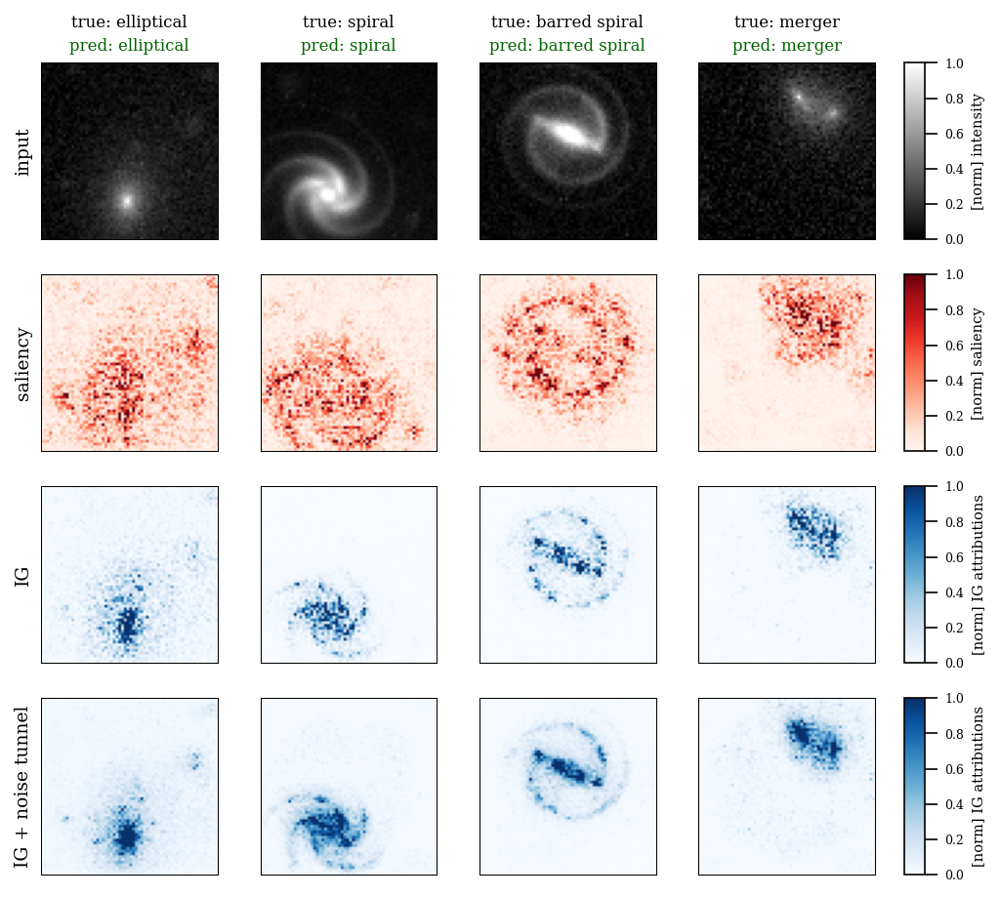

In [ ]:
def gal_saliency(model, x, target):
    x = x.clone().detach().to(device).requires_grad_(True)   # gradients on the input
    score = model(x.unsqueeze(0))[0, target]                 # the scalar we explain
    score.backward()
    return x.grad.abs().squeeze(0).cpu()                     # magnitude only


def gal_ig(model, x, target, steps=64):
    x = x.to(device)
    baseline = torch.zeros_like(x)                      # the 'empty sky' image
    alphas = torch.linspace(0, 1, steps + 1, device=device)[:-1] + 0.5 / steps
    path = baseline + alphas[:, None, None, None] * (x - baseline)   # straight path
    path.requires_grad_(True)
    grads = torch.autograd.grad(model(path)[:, target].sum(), path)[0]
    return ((x - baseline) * grads.mean(0)).squeeze(0).detach().cpu()   # Riemann sum


def gal_ig_noise_tunnel(model, x, target, nt_samples=10, stdev=None, steps=64):
    """Noise tunnel over gal_ig with the `smoothgrad_sq` rule:
    mean of the SQUARED IG maps across nt_samples noisy copies of x.

    stdev=None scales the noise to the image itself (0.5 * x.std()) -- the toy
    galaxies live on a 0-3 scale with std ~0.27, so a fixed stdev=1.0 would drown the signal and make every map look hazy.
    """
    if stdev is None:
        stdev = 0.5 * x.std().item()
    attrs = []
    for _ in range(nt_samples):
        noisy = x + stdev * torch.randn_like(x)
        attrs.append(gal_ig(model, noisy, target, steps=steps) ** 2)
    return torch.stack(attrs).mean(0).sqrt()             # RMS, not raw MSE:
    # squaring then averaging (smoothgrad_sq) shrinks small values far more than
    # large ones (0.2^2 is 25x smaller than 1.0^2, not just 5x) -- the final sqrt
    # undoes that so faint-but-real structure isn't invisible next to strong peaks.


# completeness check: sum(IG) should equal F(x) - F(baseline)
xg = gal_Xte[0]
with torch.no_grad():
    pg = gal_model(xg.unsqueeze(0).to(device)).argmax().item()
ig_g = gal_ig(gal_model, xg, pg, steps=256)
with torch.no_grad():
    delta = (gal_model(xg.unsqueeze(0).to(device))[0, pg]
             - gal_model(torch.zeros_like(xg).unsqueeze(0).to(device))[0, pg]).item()
print(f"sum(IG) = {ig_g.sum():.3f}   F(x) - F(baseline) = {delta:.3f}")

#torch.manual_seed(15129020542082896061)

# pick one random test example per class, freshly seeded from OS entropy every run
seed = torch.seed()
print(f"# torch.manual_seed({seed})   # <- uncomment the line above with this seed to reproduce this grid")

example_idx = []
for cls in range(len(CLASSES)):
    cls_idx = (gal_yte == cls).nonzero(as_tuple=True)[0]
    example_idx.append(cls_idx[torch.randint(0, len(cls_idx), (1,)).item()].item())

from mpl_toolkits.axes_grid1 import make_axes_locatable

# input / saliency / IG / IG + noise tunnel, one column per class
# each map is normalised to its own [0, 1] range (attribution maps clip at the
#99th percentile first, same contrast stretch as before, just expressed on a
# 0-1 scale) so that ONE colorbar per row is meaningful across all columns.
ncols = len(example_idx)
# a dedicated colorbar column (own axis, not carved out of the last image subplot)
fig, axes = plt.subplots(4, ncols + 1, figsize=(1.7 * ncols + 1.1, 7.2),
                          gridspec_kw={"width_ratios": [1] * ncols + [0.1], "wspace": 0.1})
img_axes, cbar_axes = axes[:, :ncols], axes[:, ncols]
row_im = [None, None, None, None]
for j, idx in enumerate(example_idx):
    xg = gal_Xte[idx]
    true_cls = gal_yte[idx].item()
    with torch.no_grad():
        pg = gal_model(xg.unsqueeze(0).to(device)).argmax().item()
    sal_j = gal_saliency(gal_model, xg, pg)
    ig_j = gal_ig(gal_model, xg, pg).abs()
    nt_j = gal_ig_noise_tunnel(gal_model, xg, pg, nt_samples=10)

    input_norm = xg.squeeze() / xg.max().clamp(min=1e-8)
    row_im[0] = img_axes[0, j].imshow(input_norm, cmap="gray", vmin=0, vmax=1)
    ax0 = img_axes[0, j]
    ax0.text(0.5, 1.18, f"true: {CLASSES[true_cls]}", transform=ax0.transAxes,
             ha="center", va="bottom", fontsize=8)
    ax0.text(0.5, 1.05, f"pred: {CLASSES[pg]}", transform=ax0.transAxes,
             ha="center", va="bottom", fontsize=8,
             color="darkgreen" if pg == true_cls else "black")
    for r, amap, cmap in [(1, sal_j, "Reds"), (2, ig_j, "Blues"), (3, nt_j, "Blues")]:
        vmax = torch.quantile(amap.flatten(), 0.99).clamp(min=1e-8)   # contrast stretch
        amap_norm = (amap / vmax).clamp(0, 1)                        # -> [0, 1]
        row_im[r] = img_axes[r, j].imshow(amap_norm, cmap=cmap, vmin=0, vmax=1)
    for r in range(4):
        clean_axis(img_axes[r, j])

row_labels = ["input", "saliency", "IG", "IG + noise tunnel"]
cbar_labels = ["[norm] intensity", "[norm] saliency",
               "[norm] IG attributions", "[norm] IG attributions"]
for r, (label, cbar_label) in enumerate(zip(row_labels, cbar_labels)):
    img_axes[r, 0].text(-0.15, 0.5, label, transform=img_axes[r, 0].transAxes,
                        rotation=90, va="center", fontsize=9)
    cbar = fig.colorbar(row_im[r], cax=cbar_axes[r])
    cbar.outline.set_visible(True)
    cbar.outline.set_linewidth(0.8)
    cbar.outline.set_edgecolor("black")
    cbar.set_label(cbar_label, fontsize=7)
    cbar.ax.tick_params(labelsize=6, width=0-[].8)
plt.tight_layout()
plt.show()

**Reading the grid above:** saliency is mostly noisy, as expected — it's a single gradient snapshot, so it mainly points us toward the *broad region* of the image where the important pixels live, not a clean map.

- **Elliptical** (correctly predicted): attribution concentrates tightly on the **central bulge** — there's no disk or arm structure to look at, so the model doesn't need to look anywhere else.
- **Spiral**: saliency alone barely hints at it, but IG starts to show structure beyond the bulge, and the noise-tunnel-averaged IG confirms it — the model is using the **morphology of the galaxy: bulge *and* spiral arms**, not just the bright core.
- **Barred spiral**: IG and the noise tunnel both clearly trace the **bar and the spiral arms** together — the model is picking up on the extended morphological structure that defines this class, not shortcutting on brightness alone.
- **Merger**: attribution spreads across **multiple distinct sources and their tidal features**, consistent with the model recognizing this as a multi-source interacting system rather than a single smooth galaxy.

<div style="border-left: 5px solid #FFA500; background-color: rgba(255, 165, 0, 0.15); padding: 10px; border-radius: 4px; color: inherit;">

<font size=4>**Question**</font>

Our IG baseline was a black image — "empty sky". Real survey images have **sky background and noise**. Is all-zeros still the right notion of *absence of signal*?

</div>

<div style="border-left: 4px solid #e57373; padding-left: 1em; padding-top: 1em; padding-bottom: 1em; margin: 1em 0; background: #fdecea; color: #1a1a1a;">
<details>

<b><summary>[Spoiler] (click here to expand)</summary></b>

Not necessarily. IG answers <i>"what changed relative to the baseline?"</i> — with an all-zeros baseline on real images, the sky itself differs from the baseline and receives attribution. A better "no galaxy present" reference is often the <b>sky level</b> (e.g. the median background) or a blurred copy of the image. The baseline is a <i>modeling choice</i>: pick the one that matches your scientific question.

</details>
</div>

## Circuit diagram: what is `gal_model` actually looking at for a barred spiral?

Same circuit-drawing recipe as the MNIST section: **gradient × activation** gives a contribution score per channel/unit at every stage (exact at the last layer, a first-order estimate earlier), we keep the top-k units per stage as the **circuit**, and draw them with their own activation map as a thumbnail (everything else greyed out). Applied here to `gal_model`'s four internal stages (`conv1` → `conv2` → `conv3` → `fc1`) for a correctly-classified **barred spiral** galaxy.

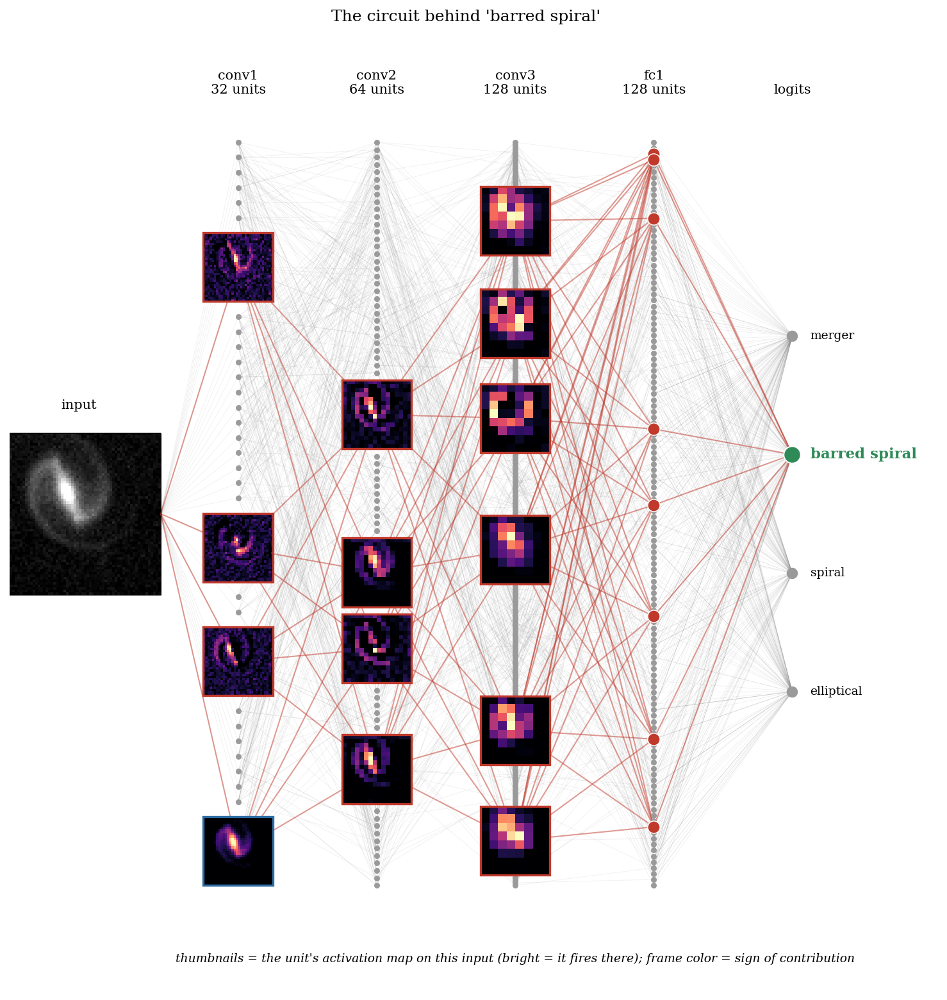

In [389]:
# ---- pick a correctly-predicted barred spiral test example -----------
barred_idx = CLASSES.index("barred spiral")
candidates = (gal_yte == barred_idx).nonzero(as_tuple=True)[0]
img = None
for i in candidates.tolist():
    xi = gal_Xte[i]
    with torch.no_grad():
        if gal_model(xi.unsqueeze(0).to(device)).argmax().item() == barred_idx:
            img = xi
            break
assert img is not None, "no correctly-classified barred spiral in the test set"
p = barred_idx
x = img.unsqueeze(0).to(device)

# forward pass, keeping the intermediate activations (so autograd can give
# us gradients w.r.t. each stage)
a1 = F.max_pool2d(F.relu(gal_model.bn1(gal_model.conv1(x))), 2)     # (1, 32, 32, 32)
a2 = F.max_pool2d(F.relu(gal_model.bn2(gal_model.conv2(a1))), 2)    # (1, 64, 16, 16)
a3 = F.max_pool2d(F.relu(gal_model.bn3(gal_model.conv3(a2))), 2)    # (1, 128, 8, 8)
a4 = F.relu(gal_model.fc1(a3.flatten(1)))                            # (1, 128)
logits_vec = gal_model.fc2(a4)[0]                                    # (4,)
stages = [("conv1", a1), ("conv2", a2), ("conv3", a3), ("fc1", a4)]

top_k = [4, 4, 6, 8]
tops = draw_circuit(stages, logits_vec, p, CLASSES, img,
                     input_display=(img.squeeze(), "gray"), top_k=top_k)

# ! IGNORE THIS NOW, I AM MODIFYING !

### Is the circuit actually sufficient?

The diagram highlights a handful of "circuit" neurons per stage, but a picture isn't a proof. Test it directly: **always keep the circuit neurons**, and progressively ablate (zero out) more and more of everyone else, from 0% up to 100%. If the circuit really is what's driving the prediction, accuracy on the whole test set should barely move even once almost every non-circuit neuron is gone.

In [ ]:
# ---- circuit sufficiency: ablate everyone EXCEPT the circuit, by degrees ----
stage_names = [name for name, _ in stages]
stage_sizes = {name: t.shape[1] for name, t in stages}
circuit_ids = dict(zip(stage_names, tops))          # the chosen (circuit) neurons, per stage

def make_masks(keep_fraction, seed=0):
    """Circuit neurons are NEVER ablated; `keep_fraction` of the remaining
    (non-circuit) neurons are also kept, chosen at random -- the rest zeroed."""
    rng = torch.Generator().manual_seed(seed)
    masks = {}
    for name in stage_names:
        n = stage_sizes[name]
        m = torch.zeros(n)
        m[circuit_ids[name]] = 1.0
        others = [i for i in range(n) if i not in set(circuit_ids[name])]
        n_keep = int(round(keep_fraction * len(others)))
        keep_others = torch.randperm(len(others), generator=rng)[:n_keep]
        for i in keep_others.tolist():
            m[others[i]] = 1.0
        masks[name] = m.to(device)
    return masks

def gal_forward_ablated(x, masks):
    def apply_mask(t, name):
        m = masks[name]
        return t * (m[None, :, None, None] if t.dim() == 4 else m[None, :])

    def bn_recalibrated(bn, t):
        # use THIS batch's own mean/var instead of the model's stale running
        # stats -- those were calibrated on the un-ablated network and badly
        # mis-normalize activations once upstream channels are zeroed out
        return F.batch_norm(t, running_mean=None, running_var=None,
                             weight=bn.weight, bias=bn.bias,
                             training=True, eps=bn.eps)

    a1 = apply_mask(F.max_pool2d(F.relu(bn_recalibrated(gal_model.bn1, gal_model.conv1(x))), 2), "conv1")
    a2 = apply_mask(F.max_pool2d(F.relu(bn_recalibrated(gal_model.bn2, gal_model.conv2(a1))), 2), "conv2")
    a3 = apply_mask(F.max_pool2d(F.relu(bn_recalibrated(gal_model.bn3, gal_model.conv3(a2))), 2), "conv3")
    a4 = apply_mask(F.relu(gal_model.fc1(a3.flatten(1))), "fc1")
    return gal_model.fc2(a4)

conditions = [
    ("keep ALL neurons (baseline)",       1.00),
    ("remove a FEW non-circuit neurons",   0.75),
    ("remove MOST non-circuit neurons",    0.10),
    ("keep ONLY the circuit neurons",      0.00),
]

print("circuit size per stage:", {n: len(circuit_ids[n]) for n in stage_names},
      " out of ", {n: stage_sizes[n] for n in stage_names})
print()

with torch.no_grad():
    full_preds = gal_model(gal_Xte.to(device)).argmax(1)
    for label, frac in conditions:
        masks = make_masks(frac)
        ablated_preds = gal_forward_ablated(gal_Xte.to(device), masks).argmax(1)
        acc = (ablated_preds == gal_yte.to(device)).float().mean().item()
        agree = (ablated_preds == full_preds).float().mean().item()
        print(f"{label:34s}: test accuracy {acc:.1%}   "
              f"(matches the un-ablated model's prediction {agree:.1%} of the time)")

## The real sky: Galaxy10 DECaLS + a pretrained model

No toy data this time: real DECaLS survey images ([Galaxy10 DECaLS](https://astronn.readthedocs.io/en/latest/galaxy10.html), 10 morphology classes) and a **pretrained** Vision Transformer fine-tuned on them, straight from the Hugging Face Hub. We use three hand-picked, **easy face-on** examples — rows #2, #78 and #57 of the test split: a face-on spiral, a barred (ringed) spiral, and a smooth elliptical.

Attribution needs *nothing new*: the model is a black box $F(x)$ with pixels in and logits out — the same IG recipe applies. Two practical tweaks for a ViT: it processes the image in **16 $\times$ 16 patches**, so raw IG comes out *blocky* — we smooth the maps for display — and we add the **noise tunnel** row for extra robustness.

<div style="border-left: 4px solid #e57373; padding-left: 1em; padding-top: 1em; padding-bottom: 1em; margin: 1em 0; background: #fdecea; color: #1a1a1a;">

**WARNING:** Optional cell — needs `transformers` + `datasets` (see Setup), downloads the model (~350 MB) plus a few streamed images, and IG + the noise tunnel on a ViT take a **few minutes** on CPU (reduce `nt_samples` / `steps` if pressed for time).

If the checkpoint name ever moves, search the Hub for any model fine-tuned on `galaxy10_decals` and swap it in.

</div>

Loading weights:   0%|          | 0/200 [00:00<?, ?it/s]

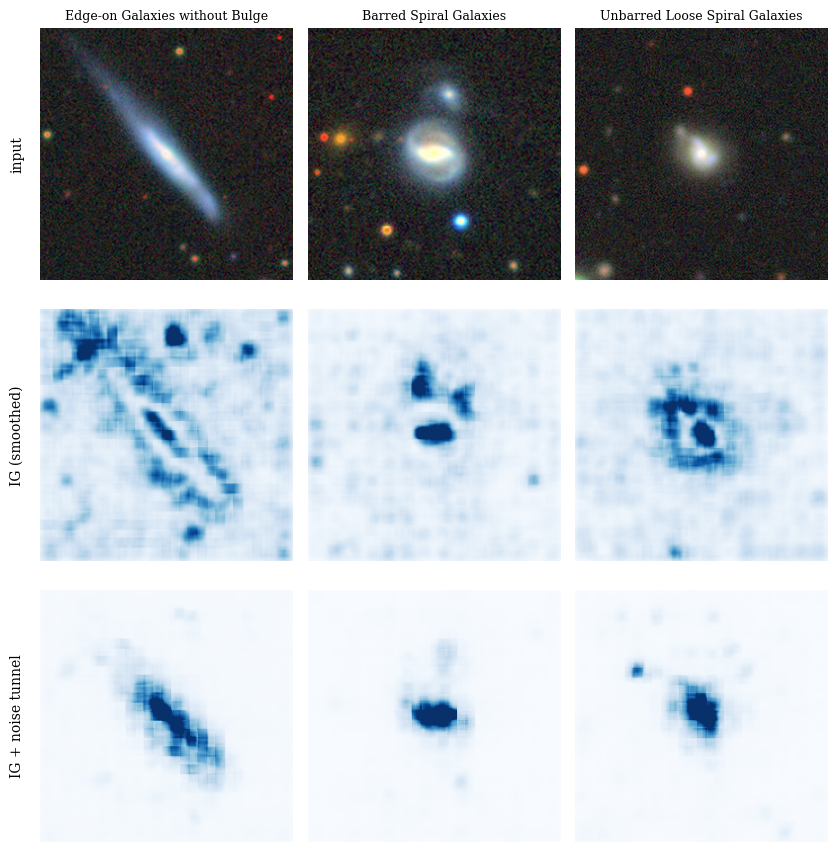

In [331]:
from datasets import load_dataset
from transformers import AutoImageProcessor, AutoModelForImageClassification

CKPT = "matthieulel/vit-base-patch16-224-finetuned-galaxy10-decals"
processor = AutoImageProcessor.from_pretrained(CKPT)
hf_model = AutoModelForImageClassification.from_pretrained(CKPT).to(device).eval()

# three hand-picked, easy face-on examples from the TEST split
# (browse: huggingface.co/datasets/matthieulel/galaxy10_decals/viewer)
ROWS = [2, 78, 57]          # face-on spiral, barred (ringed) spiral, elliptical
stream = load_dataset("matthieulel/galaxy10_decals", split="test", streaming=True)
picked = {}
for i, s in enumerate(stream):
    if i in ROWS:
        picked[i] = s
    if i >= max(ROWS):      # everything we need has streamed past
        break
samples = [picked[r] for r in ROWS]

pix = processor(images=[s["image"] for s in samples],
                return_tensors="pt")["pixel_values"].to(device)   # (3, 3, 224, 224)
with torch.no_grad():
    preds_hf = hf_model(pixel_values=pix).logits.argmax(1)


def ig_vit(x, target, steps=32):
    """IG for the ViT, looped over path points (a big batch is heavy on CPU)."""
    baseline = torch.zeros_like(x)
    alphas = torch.linspace(0, 1, steps + 1, device=device)[:-1] + 0.5 / steps
    total = torch.zeros_like(x)
    for a_ in alphas:
        xi = (baseline + a_ * (x - baseline)).detach().requires_grad_(True)
        score = hf_model(pixel_values=xi.unsqueeze(0)).logits[0, target]
        total += torch.autograd.grad(score, xi)[0]
    return ((x - baseline) * total / steps).sum(0).cpu()   # sum over RGB


def smooth(amap, k=9):
    """Box-smooth |attributions|. A ViT works on 16x16 patches, so raw IG
    comes out blocky/patchy -- smoothing makes the structure readable."""
    return F.avg_pool2d(amap.abs()[None, None], k, stride=1, padding=k // 2)[0, 0]


def ig_vit_noise_tunnel(x, target, nt_samples=6, stdev=1.0, steps=16):
    """smoothgrad_sq noise tunnel over ig_vit (same rule as before)."""
    attrs = []
    for _ in range(nt_samples):
        noisy = x + stdev * torch.randn_like(x)
        attrs.append(ig_vit(noisy, target, steps=steps) ** 2)
    return torch.stack(attrs).mean(0)


# NOTE: ~(32 + 6 x 16) ViT passes per image -> a few minutes on CPU
fig, axes = plt.subplots(3, 3, figsize=(8.4, 8.8))
for j in range(3):
    t = preds_hf[j].item()
    ig_j = smooth(ig_vit(pix[j], t))
    nt_j = smooth(ig_vit_noise_tunnel(pix[j], t))
    axes[0, j].imshow(samples[j]["image"])
    axes[0, j].set_title(hf_model.config.id2label[t], fontsize=9)
    for r, amap in [(1, ig_j), (2, nt_j)]:
        vmax = torch.quantile(amap.flatten(), 0.99)   # sharp contrast
        axes[r, j].imshow(amap, cmap="Blues", vmin=0, vmax=vmax)
    for r in range(3):
        axes[r, j].axis("off")
for r, label in enumerate(["input", "IG (smoothed)", "IG + noise tunnel"]):
    axes[r, 0].text(-0.12, 0.5, label, transform=axes[r, 0].transAxes,
                    rotation=90, va="center", fontsize=10)
plt.tight_layout()
plt.show()

<div style="border-left: 4px solid #4CAF50; padding-left: 1em; padding-top: 1em; padding-bottom: 1em; margin: 1em 0; background: #e8f5e9; color: #1a1a1a;">

**NOTE:** Everything else from the MNIST section transfers directly: compare `gal_saliency` and `gal_ig` side by side, try a **white baseline** in `gal_ig`, find the *arm-detector* neuron via its favorite test images, or re-discover the circuit on subsampled data to see which neurons are **stable**.

</div>

# Takeaways

**Saliency** $= |\partial F / \partial x|$: one backward pass, exact for linear models — but **blind to saturated features**. Use it as a quick look, never as evidence.

**Integrated gradients**: a path integral of gradients from a **baseline** to the input. It restores attribution under saturation, and **completeness** ($\sum_i \mathrm{IG}_i = F(x) - F(x')$) gives a built-in correctness check. Costs: `steps` (monitor the completeness gap) and the baseline — which is *part of the question you ask*, not an implementation detail.

**Mechanistic interpretability** attributes the output to internal units instead of pixels: **exactly** at the last layer (the logit is a weighted sum — just read off the addends), via gradient $\times$ activation deeper down. Chaining this stage by stage yields a **circuit**: the minimal cross-layer subnetwork carrying the prediction. Circuit membership depends on the data used to score it; *certified circuits* (Anani et al. 2026) make it provably stable.

<div style="border-left: 4px solid #4CAF50; padding-left: 1em; padding-top: 1em; padding-bottom: 1em; margin: 1em 0; background: #e8f5e9; color: #1a1a1a;">

<b>Important take-away message #2</b>

Interpretability claims are <i>hypotheses</i>. Test them: check completeness, ablate the neurons, perturb the dataset. Only claims that survive all three deserve a place in your paper.

</div>

## References

- Simonyan, Vedaldi & Zisserman (2013), *Deep Inside Convolutional Networks* — [arXiv:1312.6034](https://arxiv.org/abs/1312.6034)
- Sundararajan, Taly & Yan (2017), *Axiomatic Attribution for Deep Networks* — [arXiv:1703.01365](https://arxiv.org/abs/1703.01365)
- Olah et al. (2020), *Zoom In: An Introduction to Circuits* — [distill.pub/2020/circuits/zoom-in](https://distill.pub/2020/circuits/zoom-in)
- Anani, Lorenz, Schiele, Fritz & Fischer (2026), *Certified Circuits: Stability Guarantees for Mechanistic Circuits* — [arXiv:2602.22968](https://arxiv.org/abs/2602.22968), [code](https://github.com/AlaaAnani/certified-circuits)

In [ ]:
###EOF